In [1]:
from ultralytics import YOLO

model = YOLO(
r"D:\master\Master_Drone_Detection\04_experiments\YOLO26s_baseline-5\weights\best.pt"
)

model.predict(
    source=r"D:\master\Master_Drone_Detection\02_datasets\DUT_Anti_UAV\images\test",
    imgsz=960,
    conf=0.25,
    save=True,
    save_txt=True,
    device=0
)


WARNING 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/2200 D:\master\Master_Drone_Detection\02_datasets\DUT_Anti_UAV\images\test\00001.jpg: 544x960 1 UAV, 36.9ms
image 2/2200 D:\master\Master_Drone_Detection\02_datasets\DUT_Anti_UAV\images\test\00002.jpg: 544x960 1 UAV, 10.5ms
image 3/2200 D:\master\Master_Drone_Detection\02_datasets\DUT_Anti_UAV\images\test\00003.jpg: 544x960 1 UAV, 17.9ms
image 4/2200 D:\master\Master_Drone_Detection\02_datasets\DUT_Anti_UAV\images\test\00004.jpg: 544x960 1 UAV, 12.4m

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 depth: None
 keypoints: None
 masks: None
 names: {0: 'UAV'}
 obb: None
 orig_img: array([[[  8,   8,   8],
         [  8,   8,   8],
         [  8,   8,   8],
         ...,
         [  2,   2,   2],
         [  2,   2,   2],
         [  2,   2,   2]],
 
        [[  9,   9,   9],
         [  9,   9,   9],
         [  9,   9,   9],
         ...,
         [  2,   2,   2],
         [  2,   2,   2],
         [  2,   2,   2]],
 
        [[  9,   9,   9],
         [  9,   9,   9],
         [  9,   9,   9],
         ...,
         [  2,   2,   2],
         [  2,   2,   2],
         [  2,   2,   2]],
 
        ...,
 
        [[133, 128, 125],
         [133, 128, 125],
         [133, 128, 125],
         ...,
         [  1,   0,   2],
         [  1,   0,   2],
         [  1,   0,   2]],
 
        [[133, 128, 125],
         [133, 128, 125],
         [133, 128, 125],
         ...,
        

In [2]:
from pathlib import Path
import cv2
import pandas as pd

# ============================================================
# CONFIG
# ============================================================

PROJECT = Path(r"D:\master\Master_Drone_Detection")

TEST_IMAGES = PROJECT / "02_datasets" / "DUT_Anti_UAV" / "images" / "test"
TEST_LABELS = PROJECT / "02_datasets" / "DUT_Anti_UAV" / "labels" / "test"

# Predictions created by model.predict(... save_txt=True)
PRED_LABELS = (
    PROJECT
    / "notebooks"
    / "runs"
    / "detect"
    / "predict-3"
    / "labels"
)

OUTPUT_DIR = PROJECT / "04_experiments" / "YOLO26s_baseline_error_analysis"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

IOU_THRESHOLD = 0.50


# ============================================================
# YOLO NORMALIZED -> XYXY
# ============================================================

def yolo_to_xyxy(xc, yc, w, h, img_w, img_h):

    x1 = (xc - w / 2) * img_w
    y1 = (yc - h / 2) * img_h

    x2 = (xc + w / 2) * img_w
    y2 = (yc + h / 2) * img_h

    return [x1, y1, x2, y2]


# ============================================================
# IoU
# ============================================================

def calculate_iou(box1, box2):

    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])

    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    intersection_w = max(0, x2 - x1)
    intersection_h = max(0, y2 - y1)

    intersection = intersection_w * intersection_h

    area1 = max(0, box1[2] - box1[0]) * max(
        0, box1[3] - box1[1]
    )

    area2 = max(0, box2[2] - box2[0]) * max(
        0, box2[3] - box2[1]
    )

    union = area1 + area2 - intersection

    if union == 0:
        return 0.0

    return intersection / union


# ============================================================
# SIZE CATEGORY
# Based on object area relative to original image
# ============================================================

def size_category(box, img_w, img_h):

    width = max(0, box[2] - box[0])
    height = max(0, box[3] - box[1])

    object_area = width * height
    image_area = img_w * img_h

    ratio = object_area / image_area

    if ratio < 0.0005:
        return "Tiny"

    elif ratio < 0.002:
        return "Small"

    elif ratio < 0.01:
        return "Medium"

    else:
        return "Large"


# ============================================================
# READ GROUND TRUTH
# ============================================================

def read_gt(label_path, img_w, img_h):

    boxes = []

    if not label_path.exists():
        return boxes

    with open(label_path, "r") as f:

        for line in f:

            parts = line.strip().split()

            if len(parts) < 5:
                continue

            cls = int(float(parts[0]))

            xc = float(parts[1])
            yc = float(parts[2])
            w = float(parts[3])
            h = float(parts[4])

            box = yolo_to_xyxy(
                xc,
                yc,
                w,
                h,
                img_w,
                img_h
            )

            boxes.append({
                "class": cls,
                "box": box
            })

    return boxes


# ============================================================
# READ PREDICTIONS
# YOLO save_txt + save_conf format:
#
# class xc yc w h confidence
# ============================================================

def read_predictions(label_path, img_w, img_h):

    boxes = []

    if not label_path.exists():
        return boxes

    with open(label_path, "r") as f:

        for line in f:

            parts = line.strip().split()

            if len(parts) < 5:
                continue

            cls = int(float(parts[0]))

            xc = float(parts[1])
            yc = float(parts[2])
            w = float(parts[3])
            h = float(parts[4])

            confidence = (
                float(parts[5])
                if len(parts) >= 6
                else None
            )

            box = yolo_to_xyxy(
                xc,
                yc,
                w,
                h,
                img_w,
                img_h
            )

            boxes.append({
                "class": cls,
                "box": box,
                "confidence": confidence
            })

    return boxes


# ============================================================
# MATCH GT AND PREDICTIONS
# ============================================================

def match_boxes(gt_boxes, pred_boxes, iou_threshold=0.5):

    matches = []

    matched_gt = set()
    matched_pred = set()

    candidates = []

    # Calculate every possible IoU
    for gt_idx, gt in enumerate(gt_boxes):

        for pred_idx, pred in enumerate(pred_boxes):

            if gt["class"] != pred["class"]:
                continue

            iou = calculate_iou(
                gt["box"],
                pred["box"]
            )

            if iou >= iou_threshold:

                candidates.append(
                    (
                        iou,
                        gt_idx,
                        pred_idx
                    )
                )

    # Highest IoU first
    candidates.sort(
        key=lambda x: x[0],
        reverse=True
    )

    # One-to-one matching
    for iou, gt_idx, pred_idx in candidates:

        if gt_idx in matched_gt:
            continue

        if pred_idx in matched_pred:
            continue

        matched_gt.add(gt_idx)
        matched_pred.add(pred_idx)

        matches.append(
            (
                gt_idx,
                pred_idx,
                iou
            )
        )

    false_negatives = [
        i
        for i in range(len(gt_boxes))
        if i not in matched_gt
    ]

    false_positives = [
        i
        for i in range(len(pred_boxes))
        if i not in matched_pred
    ]

    return matches, false_positives, false_negatives


# ============================================================
# RUN ERROR ANALYSIS
# ============================================================

image_extensions = {
    ".jpg",
    ".jpeg",
    ".png",
    ".bmp"
}

images = sorted(
    [
        p
        for p in TEST_IMAGES.iterdir()
        if p.suffix.lower() in image_extensions
    ]
)

print("Test images found:", len(images))
print("Prediction labels:", PRED_LABELS)
print()


summary_rows = []

fp_rows = []
fn_rows = []
tp_rows = []


total_gt = 0
total_predictions = 0

total_tp = 0
total_fp = 0
total_fn = 0


for index, image_path in enumerate(images):

    image = cv2.imread(str(image_path))

    if image is None:

        print(
            "Could not read:",
            image_path
        )

        continue

    img_h, img_w = image.shape[:2]

    gt_path = (
        TEST_LABELS
        / f"{image_path.stem}.txt"
    )

    pred_path = (
        PRED_LABELS
        / f"{image_path.stem}.txt"
    )

    gt_boxes = read_gt(
        gt_path,
        img_w,
        img_h
    )

    pred_boxes = read_predictions(
        pred_path,
        img_w,
        img_h
    )

    matches, fps, fns = match_boxes(
        gt_boxes,
        pred_boxes,
        IOU_THRESHOLD
    )

    # --------------------------
    # Totals
    # --------------------------

    total_gt += len(gt_boxes)
    total_predictions += len(pred_boxes)

    total_tp += len(matches)
    total_fp += len(fps)
    total_fn += len(fns)

    # --------------------------
    # TP records
    # --------------------------

    for gt_idx, pred_idx, iou in matches:

        gt = gt_boxes[gt_idx]
        pred = pred_boxes[pred_idx]

        category = size_category(
            gt["box"],
            img_w,
            img_h
        )

        tp_rows.append({
            "image": image_path.name,
            "GT_index": gt_idx,
            "Prediction_index": pred_idx,
            "IoU": iou,
            "confidence": pred["confidence"],
            "size": category,
            "GT_box": gt["box"],
            "Prediction_box": pred["box"]
        })

    # --------------------------
    # FP records
    # --------------------------

    for pred_idx in fps:

        pred = pred_boxes[pred_idx]

        category = size_category(
            pred["box"],
            img_w,
            img_h
        )

        fp_rows.append({
            "image": image_path.name,
            "Prediction_index": pred_idx,
            "confidence": pred["confidence"],
            "size": category,
            "Prediction_box": pred["box"]
        })

    # --------------------------
    # FN records
    # --------------------------

    for gt_idx in fns:

        gt = gt_boxes[gt_idx]

        category = size_category(
            gt["box"],
            img_w,
            img_h
        )

        fn_rows.append({
            "image": image_path.name,
            "GT_index": gt_idx,
            "size": category,
            "GT_box": gt["box"]
        })

    summary_rows.append({

        "image": image_path.name,

        "GT": len(gt_boxes),

        "Predictions": len(pred_boxes),

        "TP": len(matches),

        "FP": len(fps),

        "FN": len(fns)

    })

    if (index + 1) % 200 == 0:

        print(
            f"Processed "
            f"{index + 1}/{len(images)}"
        )


# ============================================================
# METRICS
# ============================================================

precision = (
    total_tp / (total_tp + total_fp)
    if (total_tp + total_fp) > 0
    else 0
)

recall = (
    total_tp / (total_tp + total_fn)
    if (total_tp + total_fn) > 0
    else 0
)

f1 = (
    2 * precision * recall
    / (precision + recall)
    if (precision + recall) > 0
    else 0
)


print("\n" + "=" * 60)

print("YOLO26s BASELINE ERROR ANALYSIS")

print("=" * 60)

print(f"Images             : {len(images)}")

print(f"Ground Truth UAVs  : {total_gt}")

print(f"Predictions        : {total_predictions}")

print()

print(f"True Positives     : {total_tp}")

print(f"False Positives    : {total_fp}")

print(f"False Negatives    : {total_fn}")

print()

print(f"Precision @ IoU50  : {precision:.4f}")

print(f"Recall @ IoU50     : {recall:.4f}")

print(f"F1 Score           : {f1:.4f}")

print("=" * 60)


# ============================================================
# DATAFRAMES
# ============================================================

summary_df = pd.DataFrame(summary_rows)

tp_df = pd.DataFrame(tp_rows)

fp_df = pd.DataFrame(fp_rows)

fn_df = pd.DataFrame(fn_rows)


# ============================================================
# SIZE ANALYSIS
# ============================================================

size_order = [
    "Tiny",
    "Small",
    "Medium",
    "Large"
]

size_analysis = []


for category in size_order:

    tp_count = (
        (tp_df["size"] == category).sum()
        if not tp_df.empty
        else 0
    )

    fn_count = (
        (fn_df["size"] == category).sum()
        if not fn_df.empty
        else 0
    )

    total_objects = tp_count + fn_count

    recall_size = (
        tp_count / total_objects
        if total_objects > 0
        else 0
    )

    size_analysis.append({

        "size": category,

        "TP": tp_count,

        "FN": fn_count,

        "Total_GT": total_objects,

        "Recall": recall_size

    })


size_df = pd.DataFrame(size_analysis)


print("\nOBJECT SIZE ANALYSIS")

print(size_df.to_string(index=False))


# ============================================================
# WORST IMAGES
# ============================================================

worst_images = (
    summary_df
    .assign(
        total_errors=lambda x:
        x["FP"] + x["FN"]
    )
    .sort_values(
        "total_errors",
        ascending=False
    )
)


print("\nTOP 20 IMAGES WITH MOST ERRORS")

print(
    worst_images.head(20).to_string(
        index=False
    )
)


# ============================================================
# SAVE CSV FILES
# ============================================================

summary_df.to_csv(
    OUTPUT_DIR / "per_image_summary.csv",
    index=False
)

tp_df.to_csv(
    OUTPUT_DIR / "true_positives.csv",
    index=False
)

fp_df.to_csv(
    OUTPUT_DIR / "false_positives.csv",
    index=False
)

fn_df.to_csv(
    OUTPUT_DIR / "false_negatives.csv",
    index=False
)

size_df.to_csv(
    OUTPUT_DIR / "size_analysis.csv",
    index=False
)

worst_images.to_csv(
    OUTPUT_DIR / "worst_images.csv",
    index=False
)


print("\nSaved analysis to:")

print(OUTPUT_DIR)

Test images found: 2200
Prediction labels: D:\master\Master_Drone_Detection\notebooks\runs\detect\predict-3\labels

Processed 200/2200
Processed 400/2200
Processed 600/2200
Processed 800/2200
Processed 1000/2200
Processed 1200/2200
Processed 1400/2200
Processed 1600/2200
Processed 1800/2200
Processed 2000/2200
Processed 2200/2200

YOLO26s BASELINE ERROR ANALYSIS
Images             : 2200
Ground Truth UAVs  : 2245
Predictions        : 2261

True Positives     : 2176
False Positives    : 85
False Negatives    : 69

Precision @ IoU50  : 0.9624
Recall @ IoU50     : 0.9693
F1 Score           : 0.9658

OBJECT SIZE ANALYSIS
  size  TP  FN  Total_GT   Recall
  Tiny 816  20       836 0.976077
 Small 474  19       493 0.961460
Medium 355  19       374 0.949198
 Large 531  11       542 0.979705

TOP 20 IMAGES WITH MOST ERRORS
    image  GT  Predictions  TP  FP  FN  total_errors
01206.jpg   1            2   0   2   1             3
00597.jpg   1            2   0   2   1             3
00126.jpg   3 

In [3]:
from pathlib import Path
import cv2
import pandas as pd
import shutil

# ============================================================
# CONFIG
# ============================================================

PROJECT = Path(r"D:\master\Master_Drone_Detection")

TEST_IMAGES = PROJECT / "02_datasets" / "DUT_Anti_UAV" / "images" / "test"
TEST_LABELS = PROJECT / "02_datasets" / "DUT_Anti_UAV" / "labels" / "test"

PRED_LABELS = (
    PROJECT / "notebooks" / "runs" / "detect" / "predict-3" / "labels"
)

OUTPUT_DIR = (
    PROJECT / "04_experiments" /
    "YOLO26s_baseline_error_analysis" /
    "detailed_errors"
)

LOCALIZATION_DIR = OUTPUT_DIR / "localization_errors"
BACKGROUND_DIR = OUTPUT_DIR / "background_FP"
DUPLICATE_DIR = OUTPUT_DIR / "duplicate_detections"
MISS_DIR = OUTPUT_DIR / "true_misses"

for folder in [
    LOCALIZATION_DIR,
    BACKGROUND_DIR,
    DUPLICATE_DIR,
    MISS_DIR
]:
    folder.mkdir(parents=True, exist_ok=True)


# ============================================================
# THRESHOLDS
# ============================================================

# Correct detection
TP_IOU = 0.50

# Prediction overlapping GT but not enough to be TP
LOCALIZATION_IOU = 0.10


# ============================================================
# FUNCTIONS
# ============================================================

def yolo_to_xyxy(xc, yc, w, h, img_w, img_h):
    x1 = (xc - w / 2) * img_w
    y1 = (yc - h / 2) * img_h
    x2 = (xc + w / 2) * img_w
    y2 = (yc + h / 2) * img_h

    return [x1, y1, x2, y2]


def calculate_iou(box1, box2):

    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])

    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    inter_w = max(0, x2 - x1)
    inter_h = max(0, y2 - y1)

    intersection = inter_w * inter_h

    area1 = (
        max(0, box1[2] - box1[0]) *
        max(0, box1[3] - box1[1])
    )

    area2 = (
        max(0, box2[2] - box2[0]) *
        max(0, box2[3] - box2[1])
    )

    union = area1 + area2 - intersection

    if union <= 0:
        return 0.0

    return intersection / union


def read_gt(path, img_w, img_h):

    boxes = []

    if not path.exists():
        return boxes

    with open(path, "r") as f:

        for line in f:

            parts = line.strip().split()

            if len(parts) < 5:
                continue

            cls = int(float(parts[0]))

            xc, yc, w, h = map(
                float,
                parts[1:5]
            )

            box = yolo_to_xyxy(
                xc, yc, w, h,
                img_w, img_h
            )

            boxes.append({
                "class": cls,
                "box": box
            })

    return boxes


def read_predictions(path, img_w, img_h):

    boxes = []

    if not path.exists():
        return boxes

    with open(path, "r") as f:

        for line in f:

            parts = line.strip().split()

            if len(parts) < 5:
                continue

            cls = int(float(parts[0]))

            xc, yc, w, h = map(
                float,
                parts[1:5]
            )

            confidence = (
                float(parts[5])
                if len(parts) >= 6
                else None
            )

            box = yolo_to_xyxy(
                xc, yc, w, h,
                img_w, img_h
            )

            boxes.append({
                "class": cls,
                "box": box,
                "confidence": confidence
            })

    return boxes


# ============================================================
# DRAW ERROR IMAGE
# ============================================================

def draw_error_image(
    image_path,
    gt_boxes,
    pred_boxes,
    output_path,
    title
):

    image = cv2.imread(str(image_path))

    if image is None:
        return

    # Ground Truth
    for gt in gt_boxes:

        x1, y1, x2, y2 = map(
            int,
            gt["box"]
        )

        # Green GT
        cv2.rectangle(
            image,
            (x1, y1),
            (x2, y2),
            (0, 255, 0),
            2
        )

        cv2.putText(
            image,
            "GT",
            (x1, max(20, y1 - 5)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.6,
            (0, 255, 0),
            2
        )

    # Predictions
    for pred in pred_boxes:

        x1, y1, x2, y2 = map(
            int,
            pred["box"]
        )

        # Red prediction
        cv2.rectangle(
            image,
            (x1, y1),
            (x2, y2),
            (0, 0, 255),
            2
        )

        conf = pred["confidence"]

        label = "PRED"

        if conf is not None:
            label += f" {conf:.2f}"

        cv2.putText(
            image,
            label,
            (x1, min(image.shape[0] - 10, y2 + 20)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.6,
            (0, 0, 255),
            2
        )

    cv2.putText(
        image,
        title,
        (20, 35),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        (255, 255, 255),
        2
    )

    cv2.imwrite(
        str(output_path),
        image
    )


# ============================================================
# ANALYSIS
# ============================================================

records = []

iou_records = []

counts = {
    "localization_error": 0,
    "background_FP": 0,
    "duplicate_detection": 0,
    "true_miss": 0
}


image_extensions = {
    ".jpg",
    ".jpeg",
    ".png",
    ".bmp"
}

images = sorted([
    p for p in TEST_IMAGES.iterdir()
    if p.suffix.lower() in image_extensions
])


print("Images:", len(images))
print("Starting detailed error analysis...\n")


for image_index, image_path in enumerate(images):

    image = cv2.imread(str(image_path))

    if image is None:
        continue

    img_h, img_w = image.shape[:2]

    gt_path = (
        TEST_LABELS /
        f"{image_path.stem}.txt"
    )

    pred_path = (
        PRED_LABELS /
        f"{image_path.stem}.txt"
    )

    gt_boxes = read_gt(
        gt_path,
        img_w,
        img_h
    )

    pred_boxes = read_predictions(
        pred_path,
        img_w,
        img_h
    )


    # ========================================================
    # IoU MATRIX
    # ========================================================

    iou_matrix = []

    for gt in gt_boxes:

        row = []

        for pred in pred_boxes:

            iou = calculate_iou(
                gt["box"],
                pred["box"]
            )

            row.append(iou)

            iou_records.append({
                "image": image_path.name,
                "IoU": iou
            })

        iou_matrix.append(row)


    # ========================================================
    # STEP 1:
    # Find proper TP matches
    # ========================================================

    candidates = []

    for g in range(len(gt_boxes)):

        for p in range(len(pred_boxes)):

            iou = iou_matrix[g][p]

            if iou >= TP_IOU:

                candidates.append(
                    (iou, g, p)
                )


    candidates.sort(
        reverse=True,
        key=lambda x: x[0]
    )


    matched_gt = set()
    matched_pred = set()


    for iou, g, p in candidates:

        if g in matched_gt:
            continue

        if p in matched_pred:
            continue

        matched_gt.add(g)
        matched_pred.add(p)


    # ========================================================
    # STEP 2:
    # Analyze unmatched predictions
    # ========================================================

    image_error_types = set()


    for p, pred in enumerate(pred_boxes):

        if p in matched_pred:
            continue


        best_iou = 0
        best_gt = None


        for g in range(len(gt_boxes)):

            iou = iou_matrix[g][p]

            if iou > best_iou:

                best_iou = iou
                best_gt = g


        # ----------------------------------------------------
        # Localization error
        # ----------------------------------------------------

        if (
            best_gt is not None
            and LOCALIZATION_IOU <= best_iou < TP_IOU
        ):

            error_type = "localization_error"

            counts[error_type] += 1

            image_error_types.add(
                error_type
            )


        # ----------------------------------------------------
        # Duplicate detection
        # ----------------------------------------------------

        elif (
            best_gt is not None
            and best_iou >= TP_IOU
            and best_gt in matched_gt
        ):

            error_type = "duplicate_detection"

            counts[error_type] += 1

            image_error_types.add(
                error_type
            )


        # ----------------------------------------------------
        # Background FP
        # ----------------------------------------------------

        else:

            error_type = "background_FP"

            counts[error_type] += 1

            image_error_types.add(
                error_type
            )


        records.append({

            "image": image_path.name,

            "error_type": error_type,

            "prediction_index": p,

            "GT_index": best_gt,

            "best_IoU": best_iou,

            "confidence":
                pred["confidence"]

        })


    # ========================================================
    # STEP 3:
    # Analyze unmatched GT
    # ========================================================

    for g, gt in enumerate(gt_boxes):

        if g in matched_gt:
            continue


        best_iou = 0
        best_pred = None


        for p in range(len(pred_boxes)):

            iou = iou_matrix[g][p]

            if iou > best_iou:

                best_iou = iou
                best_pred = p


        # If no prediction overlaps even weakly:
        # genuine miss
        if (
            best_pred is None
            or best_iou < LOCALIZATION_IOU
        ):

            counts["true_miss"] += 1

            image_error_types.add(
                "true_miss"
            )

            records.append({

                "image": image_path.name,

                "error_type": "true_miss",

                "prediction_index": None,

                "GT_index": g,

                "best_IoU": best_iou,

                "confidence": None

            })


    # ========================================================
    # SAVE VISUAL ERROR IMAGES
    # ========================================================

    for error_type in image_error_types:

        if error_type == "localization_error":

            folder = LOCALIZATION_DIR

        elif error_type == "background_FP":

            folder = BACKGROUND_DIR

        elif error_type == "duplicate_detection":

            folder = DUPLICATE_DIR

        else:

            folder = MISS_DIR


        output_path = (
            folder /
            image_path.name
        )


        draw_error_image(
            image_path,
            gt_boxes,
            pred_boxes,
            output_path,
            error_type
        )


    if (image_index + 1) % 200 == 0:

        print(
            f"Processed "
            f"{image_index + 1}/"
            f"{len(images)}"
        )


# ============================================================
# SAVE ERROR CSV
# ============================================================

errors_df = pd.DataFrame(records)

errors_df.to_csv(
    OUTPUT_DIR / "detailed_errors.csv",
    index=False
)


# ============================================================
# IoU DISTRIBUTION FOR GT
# Use BEST prediction for each GT
# ============================================================

best_gt_ious = []


for image_path in images:

    image = cv2.imread(str(image_path))

    if image is None:
        continue

    img_h, img_w = image.shape[:2]

    gt_boxes = read_gt(
        TEST_LABELS /
        f"{image_path.stem}.txt",
        img_w,
        img_h
    )

    pred_boxes = read_predictions(
        PRED_LABELS /
        f"{image_path.stem}.txt",
        img_w,
        img_h
    )


    for gt in gt_boxes:

        if len(pred_boxes) == 0:

            best_iou = 0

        else:

            best_iou = max(
                calculate_iou(
                    gt["box"],
                    pred["box"]
                )
                for pred in pred_boxes
            )


        best_gt_ious.append(
            best_iou
        )


# ============================================================
# IoU BINS
# ============================================================

iou_bins = {
    "0.00 - 0.10": 0,
    "0.10 - 0.30": 0,
    "0.30 - 0.50": 0,
    "0.50 - 0.75": 0,
    "0.75 - 0.90": 0,
    "0.90 - 1.00": 0
}


for iou in best_gt_ious:

    if iou < 0.10:
        iou_bins["0.00 - 0.10"] += 1

    elif iou < 0.30:
        iou_bins["0.10 - 0.30"] += 1

    elif iou < 0.50:
        iou_bins["0.30 - 0.50"] += 1

    elif iou < 0.75:
        iou_bins["0.50 - 0.75"] += 1

    elif iou < 0.90:
        iou_bins["0.75 - 0.90"] += 1

    else:
        iou_bins["0.90 - 1.00"] += 1


# ============================================================
# FINAL REPORT
# ============================================================

print("\n")
print("=" * 60)

print("DETAILED ERROR TYPE ANALYSIS")

print("=" * 60)

print(
    "Localization errors :",
    counts["localization_error"]
)

print(
    "Background FP       :",
    counts["background_FP"]
)

print(
    "Duplicate detections:",
    counts["duplicate_detection"]
)

print(
    "True misses         :",
    counts["true_miss"]
)


print("\nBEST IoU DISTRIBUTION")

print("-" * 60)


for name, value in iou_bins.items():

    percentage = (
        value /
        len(best_gt_ious)
        * 100
    )

    print(
        f"{name:15s}: "
        f"{value:4d} "
        f"({percentage:.2f}%)"
    )


print("\nTotal GT analyzed:", len(best_gt_ious))

print("\nSaved to:")

print(OUTPUT_DIR)

Images: 2200
Starting detailed error analysis...

Processed 200/2200
Processed 400/2200
Processed 600/2200
Processed 800/2200
Processed 1000/2200
Processed 1200/2200
Processed 1400/2200
Processed 1600/2200
Processed 1800/2200
Processed 2000/2200
Processed 2200/2200


DETAILED ERROR TYPE ANALYSIS
Localization errors : 34
Background FP       : 43
Duplicate detections: 8
True misses         : 47

BEST IoU DISTRIBUTION
------------------------------------------------------------
0.00 - 0.10    :   47 (2.09%)
0.10 - 0.30    :    1 (0.04%)
0.30 - 0.50    :   21 (0.94%)
0.50 - 0.75    :  300 (13.36%)
0.75 - 0.90    :  949 (42.27%)
0.90 - 1.00    :  927 (41.29%)

Total GT analyzed: 2245

Saved to:
D:\master\Master_Drone_Detection\04_experiments\YOLO26s_baseline_error_analysis\detailed_errors


In [1]:
from pathlib import Path
import cv2
import pandas as pd
import numpy as np
from tqdm.auto import tqdm


# ============================================================
# CONFIG
# ============================================================

PROJECT = Path(r"D:\master\Master_Drone_Detection")

TEST_IMAGES = (
    PROJECT
    / "02_datasets"
    / "DUT_Anti_UAV"
    / "images"
    / "test"
)

TEST_LABELS = (
    PROJECT
    / "02_datasets"
    / "DUT_Anti_UAV"
    / "labels"
    / "test"
)

ERROR_DIR = (
    PROJECT
    / "04_experiments"
    / "YOLO26s_baseline_error_analysis"
    / "detailed_errors"
)

ERROR_CSV = ERROR_DIR / "detailed_errors.csv"

MISS_CROP_DIR = (
    ERROR_DIR
    / "error_crops"
    / "true_misses"
)

MISS_CROP_DIR.mkdir(
    parents=True,
    exist_ok=True
)


# ============================================================
# FUNCTIONS
# ============================================================

def yolo_to_xyxy(xc, yc, w, h, img_w, img_h):

    x1 = (xc - w / 2) * img_w
    y1 = (yc - h / 2) * img_h
    x2 = (xc + w / 2) * img_w
    y2 = (yc + h / 2) * img_h

    return [x1, y1, x2, y2]


def read_gt(label_path, img_w, img_h):

    boxes = []

    if not label_path.exists():
        return boxes

    with open(label_path, "r") as f:

        for line in f:

            parts = line.strip().split()

            if len(parts) < 5:
                continue

            cls = int(float(parts[0]))

            xc = float(parts[1])
            yc = float(parts[2])
            w = float(parts[3])
            h = float(parts[4])

            boxes.append({
                "class": cls,
                "box": yolo_to_xyxy(
                    xc,
                    yc,
                    w,
                    h,
                    img_w,
                    img_h
                )
            })

    return boxes


def get_size_category(area_ratio):

    if area_ratio < 0.0005:
        return "Tiny"

    elif area_ratio < 0.002:
        return "Small"

    elif area_ratio < 0.01:
        return "Medium"

    return "Large"


def get_position(box, img_w, img_h):

    x1, y1, x2, y2 = box

    xc = ((x1 + x2) / 2) / img_w
    yc = ((y1 + y2) / 2) / img_h

    if (
        xc < 0.15
        or xc > 0.85
        or yc < 0.15
        or yc > 0.85
    ):
        return "Edge"

    return "Center"


# ============================================================
# LOAD ONLY TRUE MISSES
# ============================================================

errors = pd.read_csv(ERROR_CSV)

misses = (
    errors[
        errors["error_type"] == "true_miss"
    ]
    .copy()
    .reset_index(drop=True)
)


print(f"True misses found: {len(misses)}")

# Should be 47 based on your previous result


# ============================================================
# ANALYZE ONLY THE 47 MISSES
# ============================================================

records = []


for _, row in tqdm(
    misses.iterrows(),
    total=len(misses),
    desc="Analyzing true misses",
    unit="UAV"
):

    image_name = row["image"]

    image_path = TEST_IMAGES / image_name

    # --------------------------------------------
    # Read image ONCE
    # --------------------------------------------

    image = cv2.imread(str(image_path))

    if image is None:

        print(f"\nCould not read: {image_path}")
        continue


    img_h, img_w = image.shape[:2]


    # --------------------------------------------
    # Read GT
    # --------------------------------------------

    label_path = (
        TEST_LABELS
        / f"{Path(image_name).stem}.txt"
    )

    gt_boxes = read_gt(
        label_path,
        img_w,
        img_h
    )


    gt_index = int(row["GT_index"])

    if gt_index >= len(gt_boxes):

        print(
            f"\nInvalid GT index: "
            f"{image_name} -> {gt_index}"
        )

        continue


    box = gt_boxes[gt_index]["box"]

    x1, y1, x2, y2 = box


    # --------------------------------------------
    # Integer + clamp
    # --------------------------------------------

    x1 = max(0, int(round(x1)))
    y1 = max(0, int(round(y1)))

    x2 = min(img_w, int(round(x2)))
    y2 = min(img_h, int(round(y2)))


    width = max(0, x2 - x1)
    height = max(0, y2 - y1)


    if width == 0 or height == 0:
        continue


    area = width * height

    area_ratio = (
        area / float(img_w * img_h)
    )


    # --------------------------------------------
    # Object information
    # --------------------------------------------

    size = get_size_category(
        area_ratio
    )

    position = get_position(
        box,
        img_w,
        img_h
    )

    aspect_ratio = (
        width / float(height)
    )


    # ========================================================
    # CONTEXT CROP
    # ========================================================

    # Include background around UAV.
    # Useful for contrast / blur analysis.

    pad_x = max(
        int(width * 2),
        20
    )

    pad_y = max(
        int(height * 2),
        20
    )


    cx1 = max(
        0,
        x1 - pad_x
    )

    cy1 = max(
        0,
        y1 - pad_y
    )

    cx2 = min(
        img_w,
        x2 + pad_x
    )

    cy2 = min(
        img_h,
        y2 + pad_y
    )


    crop = image[
        cy1:cy2,
        cx1:cx2
    ]


    if crop.size == 0:
        continue


    # --------------------------------------------
    # Convert once to grayscale
    # --------------------------------------------

    gray = cv2.cvtColor(
        crop,
        cv2.COLOR_BGR2GRAY
    )


    # --------------------------------------------
    # Brightness
    # --------------------------------------------

    brightness = float(
        gray.mean()
    )


    # --------------------------------------------
    # Contrast
    # --------------------------------------------

    contrast = float(
        gray.std()
    )


    # --------------------------------------------
    # Blur
    #
    # Lower value generally means blurrier image.
    # --------------------------------------------

    blur_score = float(
        cv2.Laplacian(
            gray,
            cv2.CV_64F
        ).var()
    )


    # ========================================================
    # SAVE CROP
    # ========================================================

    crop_name = (
        f"{Path(image_name).stem}"
        f"_GT{gt_index}.jpg"
    )

    cv2.imwrite(
        str(
            MISS_CROP_DIR
            / crop_name
        ),
        crop
    )


    # ========================================================
    # RECORD
    # ========================================================

    records.append({

        "image": image_name,

        "GT_index": gt_index,

        "width_px": width,

        "height_px": height,

        "area_px": area,

        "area_ratio": area_ratio,

        "size": size,

        "aspect_ratio": aspect_ratio,

        "position": position,

        "brightness": brightness,

        "contrast": contrast,

        "blur_score": blur_score,

        "best_IoU": row["best_IoU"]
    })


# ============================================================
# DATAFRAME
# ============================================================

miss_df = pd.DataFrame(records)


# ============================================================
# SAVE CSV
# ============================================================

output_csv = (
    ERROR_DIR
    / "true_miss_characteristics.csv"
)

miss_df.to_csv(
    output_csv,
    index=False
)


# ============================================================
# FINAL REPORT
# ============================================================

print("\n")
print("=" * 65)

print("TRUE MISS CHARACTERISTICS")

print("=" * 65)

print(
    f"\nTotal analyzed: "
    f"{len(miss_df)}"
)


# ------------------------------------------------------------
# SIZE
# ------------------------------------------------------------

print("\nSIZE DISTRIBUTION")
print("-" * 40)

size_counts = (
    miss_df["size"]
    .value_counts()
    .reindex(
        [
            "Tiny",
            "Small",
            "Medium",
            "Large"
        ],
        fill_value=0
    )
)

print(size_counts)


# ------------------------------------------------------------
# POSITION
# ------------------------------------------------------------

print("\nPOSITION")
print("-" * 40)

print(
    miss_df["position"]
    .value_counts()
)


# ------------------------------------------------------------
# PIXEL SIZE
# ------------------------------------------------------------

print("\nPIXEL SIZE")
print("-" * 40)

print(
    miss_df[
        [
            "width_px",
            "height_px",
            "area_px"
        ]
    ]
    .describe()
    .round(2)
)


# ------------------------------------------------------------
# IMAGE CHARACTERISTICS
# ------------------------------------------------------------

print("\nIMAGE CHARACTERISTICS")
print("-" * 40)

print(
    miss_df[
        [
            "brightness",
            "contrast",
            "blur_score"
        ]
    ]
    .describe()
    .round(2)
)


# ------------------------------------------------------------
# ASPECT RATIO
# ------------------------------------------------------------

print("\nASPECT RATIO")
print("-" * 40)

print(
    miss_df[
        "aspect_ratio"
    ]
    .describe()
    .round(3)
)


# ------------------------------------------------------------
# 10 SMALLEST MISSES
# ------------------------------------------------------------

print("\n10 SMALLEST MISSED UAVs")
print("-" * 40)

columns = [
    "image",
    "width_px",
    "height_px",
    "area_px",
    "size",
    "position",
    "contrast",
    "blur_score"
]

print(
    miss_df
    .sort_values("area_px")
    [columns]
    .head(10)
    .round(2)
    .to_string(index=False)
)


# ============================================================
# FINISHED
# ============================================================

print("\n" + "=" * 65)

print("DONE")

print("=" * 65)

print(f"\nCSV saved to:\n{output_csv}")

print(
    f"\nMiss crops saved to:\n"
    f"{MISS_CROP_DIR}"
)

True misses found: 47


Analyzing true misses:   0%|          | 0/47 [00:00<?, ?UAV/s]



TRUE MISS CHARACTERISTICS

Total analyzed: 47

SIZE DISTRIBUTION
----------------------------------------
size
Tiny      13
Small     14
Medium    14
Large      6
Name: count, dtype: int64

POSITION
----------------------------------------
position
Center    42
Edge       5
Name: count, dtype: int64

PIXEL SIZE
----------------------------------------
       width_px  height_px   area_px
count     47.00      47.00     47.00
mean      86.19      41.21   5615.72
std       73.37      31.46   9838.16
min       22.00      11.00    242.00
25%       37.00      19.00    703.00
50%       63.00      28.00   1716.00
75%      104.50      54.50   5821.00
max      329.00     157.00  51653.00

IMAGE CHARACTERISTICS
----------------------------------------
       brightness  contrast  blur_score
count       47.00     47.00       47.00
mean       107.07     43.58      364.77
std         43.43     17.64      403.46
min         34.36      6.71       19.70
25%         69.17     30.55       86.43
50%    

In [3]:
from pathlib import Path

DATASET = Path(
    r"D:\master\Master_Drone_Detection\02_datasets\DUT_Anti_UAV"
)

print("DATASET STRUCTURE")
print("=" * 60)

for p in sorted(DATASET.rglob("*")):
    if p.is_dir():
        print("[DIR] ", p.relative_to(DATASET))

print("\nOTHER FILES / METADATA")
print("=" * 60)

for p in sorted(DATASET.rglob("*")):
    if p.is_file() and p.suffix.lower() not in {
        ".jpg", ".jpeg", ".png", ".bmp", ".txt"
    }:
        print(p.relative_to(DATASET))

DATASET STRUCTURE
[DIR]  images
[DIR]  images\test
[DIR]  images\train
[DIR]  images\val
[DIR]  labels
[DIR]  labels\test
[DIR]  labels\train
[DIR]  labels\val
[DIR]  runs
[DIR]  runs\04_experiments
[DIR]  runs\04_experiments\EXP003_YOLOv8s_P2_960
[DIR]  runs\04_experiments\EXP003_YOLOv8s_P2_960\weights
[DIR]  visual_check

OTHER FILES / METADATA
data.yaml
labels\test.cache
labels\train.cache
labels\val.cache
runs\04_experiments\EXP003_YOLOv8s_P2_960\args.yaml
runs\04_experiments\EXP003_YOLOv8s_P2_960\results.csv
runs\04_experiments\EXP003_YOLOv8s_P2_960\weights\best.pt
runs\04_experiments\EXP003_YOLOv8s_P2_960\weights\last.pt


In [4]:
for split in ["train", "val", "test"]:
    folder = DATASET / "images" / split

    files = sorted(folder.glob("*"))

    print(f"\n{split.upper()} — {len(files)} images")

    print("First 10:")
    print([x.name for x in files[:10]])

    print("Last 10:")
    print([x.name for x in files[-10:]])


TRAIN — 5199 images
First 10:
['00001.jpg', '00002.jpg', '00003.jpg', '00004.jpg', '00005.jpg', '00006.jpg', '00007.jpg', '00008.jpg', '00009.jpg', '00010.jpg']
Last 10:
['05191.jpg', '05192.jpg', '05193.jpg', '05194.jpg', '05195.jpg', '05196.jpg', '05197.jpg', '05198.jpg', '05199.jpg', '05200.jpg']

VAL — 2600 images
First 10:
['00001.jpg', '00002.jpg', '00003.jpg', '00004.jpg', '00005.jpg', '00006.jpg', '00007.jpg', '00008.jpg', '00009.jpg', '00010.jpg']
Last 10:
['02591.jpg', '02592.jpg', '02593.jpg', '02594.jpg', '02595.jpg', '02596.jpg', '02597.jpg', '02598.jpg', '02599.jpg', '02600.jpg']

TEST — 2200 images
First 10:
['00001.jpg', '00002.jpg', '00003.jpg', '00004.jpg', '00005.jpg', '00006.jpg', '00007.jpg', '00008.jpg', '00009.jpg', '00010.jpg']
Last 10:
['02191.jpg', '02192.jpg', '02193.jpg', '02194.jpg', '02195.jpg', '02196.jpg', '02197.jpg', '02198.jpg', '02199.jpg', '02200.jpg']


In [7]:
from pathlib import Path
import cv2
import pandas as pd
import numpy as np
from tqdm.auto import tqdm
from skimage.metrics import structural_similarity as ssim


# ============================================================
# PATHS
# ============================================================

PROJECT = Path(r"D:\master\Master_Drone_Detection")

DATASET = (
    PROJECT
    / "02_datasets"
    / "DUT_Anti_UAV"
)

INTEGRITY_DIR = (
    PROJECT
    / "04_experiments"
    / "dataset_integrity"
)

CANDIDATE_FILE = (
    INTEGRITY_DIR
    / "near_duplicate_candidates.csv"
)


SPLIT_DIRS = {
    "train": DATASET / "images" / "train",
    "val": DATASET / "images" / "val",
    "test": DATASET / "images" / "test",
}


# ============================================================
# SETTINGS
# ============================================================

# Only strongest dHash candidates
DHASH_DISTANCE = 0

# Don't waste time checking tens of thousands initially
MAX_PAIRS = 2000

# Resize for fast SSIM comparison
COMPARE_SIZE = (320, 180)

# Very strong similarity threshold
SSIM_THRESHOLD = 0.95


# ============================================================
# LOAD CANDIDATES
# ============================================================

df = pd.read_csv(CANDIDATE_FILE)

candidates = df[
    df["hamming_distance"] == DHASH_DISTANCE
].copy()


# Prioritize train-test first
priority = {
    ("train", "test"): 0,
    ("train", "val"): 1,
    ("val", "test"): 2
}


candidates["priority"] = candidates.apply(
    lambda r: priority.get(
        (r["split_A"], r["split_B"]),
        99
    ),
    axis=1
)


candidates = (
    candidates
    .sort_values("priority")
    .head(MAX_PAIRS)
    .reset_index(drop=True)
)


print(
    f"Checking {len(candidates)} "
    f"strongest dHash=0 candidates..."
)


# ============================================================
# IMAGE READER
# ============================================================

def load_gray(path):

    img = cv2.imread(
        str(path),
        cv2.IMREAD_GRAYSCALE
    )

    if img is None:
        return None

    img = cv2.resize(
        img,
        COMPARE_SIZE,
        interpolation=cv2.INTER_AREA
    )

    return img


# ============================================================
# SSIM ANALYSIS
# ============================================================

results = []


for _, row in tqdm(
    candidates.iterrows(),
    total=len(candidates),
    desc="Verifying candidates",
    unit="pair"
):

    path_a = (
        SPLIT_DIRS[row["split_A"]]
        / row["image_A"]
    )

    path_b = (
        SPLIT_DIRS[row["split_B"]]
        / row["image_B"]
    )


    img_a = load_gray(path_a)
    img_b = load_gray(path_b)


    if img_a is None or img_b is None:
        continue


    score = ssim(
        img_a,
        img_b,
        data_range=255
    )


    results.append({

        "split_A": row["split_A"],
        "image_A": row["image_A"],

        "split_B": row["split_B"],
        "image_B": row["image_B"],

        "SSIM": score
    })


# ============================================================
# RESULTS
# ============================================================

results_df = pd.DataFrame(results)

results_df = results_df.sort_values(
    "SSIM",
    ascending=False
)


strong = results_df[
    results_df["SSIM"]
    >= SSIM_THRESHOLD
].copy()


# ============================================================
# SAVE
# ============================================================

results_df.to_csv(
    INTEGRITY_DIR
    / "ssim_verified_candidates.csv",
    index=False
)

strong.to_csv(
    INTEGRITY_DIR
    / "strong_near_duplicates.csv",
    index=False
)


# ============================================================
# REPORT
# ============================================================

print("\n")
print("=" * 65)

print("SSIM DUPLICATE VERIFICATION")

print("=" * 65)

print(
    f"\nPairs checked: "
    f"{len(results_df)}"
)

print(
    f"SSIM >= {SSIM_THRESHOLD}: "
    f"{len(strong)}"
)


if len(results_df) > 0:

    print(
        f"\nMaximum SSIM: "
        f"{results_df['SSIM'].max():.6f}"
    )

    print(
        f"Median SSIM: "
        f"{results_df['SSIM'].median():.6f}"
    )


if not strong.empty:

    print(
        "\nSTRONGEST CROSS-SPLIT PAIRS"
    )

    print("-" * 65)

    print(
        strong[
            [
                "split_A",
                "image_A",
                "split_B",
                "image_B",
                "SSIM"
            ]
        ]
        .head(30)
        .to_string(index=False)
    )


print("\n" + "=" * 65)
print("DONE")
print("=" * 65)

Checking 2000 strongest dHash=0 candidates...


Verifying candidates:   0%|          | 0/2000 [00:00<?, ?pair/s]



SSIM DUPLICATE VERIFICATION

Pairs checked: 2000
SSIM >= 0.95: 1763

Maximum SSIM: 0.994373
Median SSIM: 0.977916

STRONGEST CROSS-SPLIT PAIRS
-----------------------------------------------------------------
split_A   image_A split_B   image_B     SSIM
  train 01025.jpg    test 01502.jpg 0.994373
  train 00966.jpg    test 00393.jpg 0.994289
  train 00966.jpg    test 01488.jpg 0.994289
  train 00946.jpg    test 01486.jpg 0.993405
  train 00946.jpg    test 00392.jpg 0.993405
  train 01230.jpg    test 01539.jpg 0.993396
  train 01230.jpg    test 00440.jpg 0.993396
  train 05190.jpg    test 00955.jpg 0.993383
  train 05191.jpg    test 00955.jpg 0.993356
  train 00945.jpg    test 01486.jpg 0.993347
  train 00945.jpg    test 00392.jpg 0.993347
  train 01203.jpg    test 01534.jpg 0.993160
  train 01203.jpg    test 00436.jpg 0.993160
  train 01226.jpg    test 00438.jpg 0.993134
  train 01226.jpg    test 01537.jpg 0.993134
  train 00913.jpg    test 01474.jpg 0.993048
  train 00913.jpg    tes

In [8]:
from pathlib import Path
import cv2
import pandas as pd
from tqdm.auto import tqdm

# ============================================================
# PATHS
# ============================================================

PROJECT = Path(r"D:\master\Master_Drone_Detection")

DATASET = (
    PROJECT
    / "02_datasets"
    / "DUT_Anti_UAV"
)

INTEGRITY_DIR = (
    PROJECT
    / "04_experiments"
    / "dataset_integrity"
)

SSIM_FILE = (
    INTEGRITY_DIR
    / "ssim_verified_candidates.csv"
)

OUTPUT_DIR = (
    INTEGRITY_DIR
    / "visual_pairs"
)

OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)

SPLIT_DIRS = {
    "train": DATASET / "images" / "train",
    "val": DATASET / "images" / "val",
    "test": DATASET / "images" / "test",
}


# ============================================================
# LOAD TOP 30
# ============================================================

df = pd.read_csv(SSIM_FILE)

top = (
    df
    .sort_values("SSIM", ascending=False)
    .head(30)
    .reset_index(drop=True)
)

print(f"Creating {len(top)} comparison images...")


# ============================================================
# CREATE SIDE-BY-SIDE IMAGES
# ============================================================

TARGET_H = 500


for i, row in tqdm(
    top.iterrows(),
    total=len(top),
    desc="Creating comparisons",
    unit="pair"
):

    path_a = (
        SPLIT_DIRS[row["split_A"]]
        / row["image_A"]
    )

    path_b = (
        SPLIT_DIRS[row["split_B"]]
        / row["image_B"]
    )

    img_a = cv2.imread(str(path_a))
    img_b = cv2.imread(str(path_b))

    if img_a is None or img_b is None:
        continue


    # --------------------------------------------------------
    # Resize while preserving aspect ratio
    # --------------------------------------------------------

    def resize_height(img, target_h):

        h, w = img.shape[:2]

        scale = target_h / h

        new_w = int(w * scale)

        return cv2.resize(
            img,
            (new_w, target_h),
            interpolation=cv2.INTER_AREA
        )


    img_a = resize_height(
        img_a,
        TARGET_H
    )

    img_b = resize_height(
        img_b,
        TARGET_H
    )


    # --------------------------------------------------------
    # Labels
    # --------------------------------------------------------

    cv2.putText(
        img_a,
        f'{row["split_A"]}: {row["image_A"]}',
        (20, 35),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        (0, 255, 0),
        2
    )

    cv2.putText(
        img_b,
        f'{row["split_B"]}: {row["image_B"]}',
        (20, 35),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        (0, 0, 255),
        2
    )


    # --------------------------------------------------------
    # Combine
    # --------------------------------------------------------

    pair = cv2.hconcat([
        img_a,
        img_b
    ])


    cv2.putText(
        pair,
        f'SSIM = {row["SSIM"]:.4f}',
        (20, TARGET_H - 20),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        (255, 255, 255),
        2
    )


    # --------------------------------------------------------
    # Save
    # --------------------------------------------------------

    output_name = (
        f'{i+1:02d}_'
        f'{row["split_A"]}_{Path(row["image_A"]).stem}_'
        f'{row["split_B"]}_{Path(row["image_B"]).stem}_'
        f'SSIM_{row["SSIM"]:.4f}.jpg'
    )

    cv2.imwrite(
        str(OUTPUT_DIR / output_name),
        pair
    )


print("\nDONE")
print(f"Saved to:\n{OUTPUT_DIR}")

Creating 30 comparison images...


Creating comparisons:   0%|          | 0/30 [00:00<?, ?pair/s]


DONE
Saved to:
D:\master\Master_Drone_Detection\04_experiments\dataset_integrity\visual_pairs


In [9]:
from pathlib import Path
import pandas as pd

# ============================================================
# PATHS
# ============================================================

PROJECT = Path(r"D:\master\Master_Drone_Detection")

INTEGRITY_DIR = (
    PROJECT
    / "04_experiments"
    / "dataset_integrity"
)

SSIM_FILE = (
    INTEGRITY_DIR
    / "ssim_verified_candidates.csv"
)

# ============================================================
# LOAD
# ============================================================

df = pd.read_csv(SSIM_FILE)

print("Pairs available:", len(df))

# ============================================================
# IMPORTANT THRESHOLDS
# ============================================================

thresholds = [
    0.95,
    0.97,
    0.98,
    0.99
]

print("\n" + "=" * 70)
print("CROSS-SPLIT SCENE OVERLAP ANALYSIS")
print("=" * 70)

# ============================================================
# ANALYZE EACH THRESHOLD
# ============================================================

summary = []

for threshold in thresholds:

    temp = df[
        df["SSIM"] >= threshold
    ].copy()

    print(f"\nSSIM >= {threshold}")
    print("-" * 50)

    print(
        f"Similar pairs: "
        f"{len(temp)}"
    )

    # --------------------------------------------
    # Train -> Test
    # --------------------------------------------

    train_test = temp[
        (temp["split_A"] == "train")
        &
        (temp["split_B"] == "test")
    ]

    unique_train_tt = (
        train_test["image_A"].nunique()
    )

    unique_test_tt = (
        train_test["image_B"].nunique()
    )

    print(
        f"Train-Test pairs: "
        f"{len(train_test)}"
    )

    print(
        f"Unique Train images involved: "
        f"{unique_train_tt}"
    )

    print(
        f"Unique Test images involved: "
        f"{unique_test_tt}"
    )

    # --------------------------------------------
    # Train -> Val
    # --------------------------------------------

    train_val = temp[
        (temp["split_A"] == "train")
        &
        (temp["split_B"] == "val")
    ]

    unique_train_tv = (
        train_val["image_A"].nunique()
    )

    unique_val_tv = (
        train_val["image_B"].nunique()
    )

    print(
        f"Train-Val pairs: "
        f"{len(train_val)}"
    )

    print(
        f"Unique Val images involved: "
        f"{unique_val_tv}"
    )

    # --------------------------------------------
    # Val -> Test
    # --------------------------------------------

    val_test = temp[
        (temp["split_A"] == "val")
        &
        (temp["split_B"] == "test")
    ]

    unique_val_vt = (
        val_test["image_A"].nunique()
    )

    unique_test_vt = (
        val_test["image_B"].nunique()
    )

    print(
        f"Val-Test pairs: "
        f"{len(val_test)}"
    )

    print(
        f"Unique Test images involved "
        f"(Val-Test): {unique_test_vt}"
    )

    summary.append({

        "SSIM_threshold": threshold,

        "similar_pairs":
            len(temp),

        "train_test_pairs":
            len(train_test),

        "unique_train_in_train_test":
            unique_train_tt,

        "unique_test_in_train_test":
            unique_test_tt,

        "train_val_pairs":
            len(train_val),

        "unique_val_in_train_val":
            unique_val_tv,

        "val_test_pairs":
            len(val_test),

        "unique_test_in_val_test":
            unique_test_vt
    })


# ============================================================
# SUMMARY TABLE
# ============================================================

summary_df = pd.DataFrame(
    summary
)

print("\n")
print("=" * 70)

print("SUMMARY")

print("=" * 70)

print(
    summary_df.to_string(
        index=False
    )
)


# ============================================================
# IMPORTANT:
# BEST TRAIN MATCH FOR EACH TEST IMAGE
# ============================================================

train_test_all = df[
    (df["split_A"] == "train")
    &
    (df["split_B"] == "test")
].copy()


if not train_test_all.empty:

    best_train_match = (
        train_test_all
        .sort_values(
            "SSIM",
            ascending=False
        )
        .drop_duplicates(
            subset=["image_B"],
            keep="first"
        )
        .sort_values(
            "SSIM",
            ascending=False
        )
    )


    print("\n")
    print("=" * 70)

    print(
        "BEST TRAIN MATCH FOR EACH "
        "MATCHED TEST IMAGE"
    )

    print("=" * 70)


    print(
        "\nNumber of Test images "
        "with a candidate Train match:",
        len(best_train_match)
    )


    print("\nBest-match SSIM statistics:")

    print(
        best_train_match["SSIM"]
        .describe()
        .round(6)
    )


    print(
        "\nTest images with "
        "best Train SSIM >= 0.95:",
        (
            best_train_match["SSIM"]
            >= 0.95
        ).sum()
    )


    print(
        "Test images with "
        "best Train SSIM >= 0.98:",
        (
            best_train_match["SSIM"]
            >= 0.98
        ).sum()
    )


    print(
        "Test images with "
        "best Train SSIM >= 0.99:",
        (
            best_train_match["SSIM"]
            >= 0.99
        ).sum()
    )


    # Save
    best_train_match.to_csv(
        INTEGRITY_DIR
        / "best_train_match_per_test_image.csv",
        index=False
    )


# ============================================================
# SAVE SUMMARY
# ============================================================

summary_df.to_csv(
    INTEGRITY_DIR
    / "scene_overlap_summary.csv",
    index=False
)


print("\n" + "=" * 70)
print("DONE")
print("=" * 70)

print(
    "\nSaved to:\n"
    f"{INTEGRITY_DIR}"
)

Pairs available: 2000

CROSS-SPLIT SCENE OVERLAP ANALYSIS

SSIM >= 0.95
--------------------------------------------------
Similar pairs: 1763
Train-Test pairs: 1763
Unique Train images involved: 439
Unique Test images involved: 211
Train-Val pairs: 0
Unique Val images involved: 0
Val-Test pairs: 0
Unique Test images involved (Val-Test): 0

SSIM >= 0.97
--------------------------------------------------
Similar pairs: 1316
Train-Test pairs: 1316
Unique Train images involved: 358
Unique Test images involved: 188
Train-Val pairs: 0
Unique Val images involved: 0
Val-Test pairs: 0
Unique Test images involved (Val-Test): 0

SSIM >= 0.98
--------------------------------------------------
Similar pairs: 865
Train-Test pairs: 865
Unique Train images involved: 288
Unique Test images involved: 163
Train-Val pairs: 0
Unique Val images involved: 0
Val-Test pairs: 0
Unique Test images involved (Val-Test): 0

SSIM >= 0.99
--------------------------------------------------
Similar pairs: 138
Train-Te

In [10]:
from pathlib import Path

PROJECT = Path(r"D:\master\Master_Drone_Detection")

# كلمات غالبًا موجودة في كود تقسيم الداتا
KEYWORDS = [
    "train_test_split",
    "random_split",
    "shuffle",
    "train_ratio",
    "val_ratio",
    "test_ratio",
    "0.52",
    "0.26",
    "0.22",
    "5200",
    "2600",
    "2200",
    "shutil.copy",
    "copy2",
    "images/train",
    "images/val",
    "images/test",
]

# أنواع الملفات التي نبحث بداخلها
EXTENSIONS = {
    ".py",
    ".ipynb",
    ".txt",
    ".yaml",
    ".yml",
    ".json",
    ".md",
}

matches = []

files = [
    p for p in PROJECT.rglob("*")
    if p.is_file()
    and p.suffix.lower() in EXTENSIONS
    and ".venv" not in p.parts
    and "site-packages" not in p.parts
]

print(f"Searching {len(files)} project files...\n")

for path in files:

    try:
        text = path.read_text(
            encoding="utf-8",
            errors="ignore"
        )
    except Exception:
        continue

    found = [
        keyword
        for keyword in KEYWORDS
        if keyword.lower() in text.lower()
    ]

    if found:
        matches.append((path, found))


print("=" * 70)
print("POSSIBLE DATASET-SPLIT FILES")
print("=" * 70)

if not matches:
    print("\nNo split script found.")

else:
    for i, (path, found) in enumerate(matches, 1):

        print(f"\n[{i}] {path.relative_to(PROJECT)}")
        print("    Keywords:", ", ".join(found))


print("\n" + "=" * 70)
print(f"Files matched: {len(matches)}")
print("=" * 70)

Searching 12198 project files...

POSSIBLE DATASET-SPLIT FILES

[1] EXPERIMENT_REGISTRY.md
    Keywords: 0.26

[2] MASTER_PROJECT_SUMMARY.md
    Keywords: 0.26, 2200, images/train, images/val, images/test

[3] NOTEBOOK_REGISTRY.md
    Keywords: 0.26

[4] 02_datasets\DUT_Anti_UAV\data.yaml
    Keywords: images/train, images/val, images/test

[5] 02_datasets\DUT_Anti_UAV\labels\test\00003.txt
    Keywords: 0.22

[6] 02_datasets\DUT_Anti_UAV\labels\test\00005.txt
    Keywords: 0.52

[7] 02_datasets\DUT_Anti_UAV\labels\test\00009.txt
    Keywords: 0.26

[8] 02_datasets\DUT_Anti_UAV\labels\test\00010.txt
    Keywords: 0.22

[9] 02_datasets\DUT_Anti_UAV\labels\test\00011.txt
    Keywords: 0.22

[10] 02_datasets\DUT_Anti_UAV\labels\test\00013.txt
    Keywords: 0.26

[11] 02_datasets\DUT_Anti_UAV\labels\test\00024.txt
    Keywords: 0.22

[12] 02_datasets\DUT_Anti_UAV\labels\test\00053.txt
    Keywords: 0.26

[13] 02_datasets\DUT_Anti_UAV\labels\test\00055.txt
    Keywords: 0.22

[14] 02_datase

In [11]:
from pathlib import Path

PROJECT = Path(r"D:\master\Master_Drone_Detection")

KEYWORDS = [
    "train_test_split",
    "random_split",
    "shuffle",
    "train_ratio",
    "val_ratio",
    "test_ratio",
    "5200",
    "2600",
    "2200",
    "shutil.copy",
    "copy2",
    "images/train",
    "images/val",
    "images/test",
]

EXTENSIONS = {
    ".py",
    ".ipynb",
    ".txt",
    ".yaml",
    ".yml",
    ".json",
    ".md",
}

matches = []

files = [
    p for p in PROJECT.rglob("*")
    if p.is_file()
    and p.suffix.lower() in EXTENSIONS
    and ".venv" not in p.parts
    and "site-packages" not in p.parts
]

print(f"Searching {len(files)} project files...\n")

for path in files:
    try:
        text = path.read_text(
            encoding="utf-8",
            errors="ignore"
        )
    except Exception:
        continue

    found = [
        keyword
        for keyword in KEYWORDS
        if keyword.lower() in text.lower()
    ]

    if found:
        matches.append((path, found))

print("=" * 70)
print("POSSIBLE DATASET-SPLIT FILES")
print("=" * 70)

if not matches:
    print("\nNo split script found.")
else:
    for i, (path, found) in enumerate(matches, 1):
        print(f"\n[{i}] {path.relative_to(PROJECT)}")
        print("Keywords:", ", ".join(found))

print("\n" + "=" * 70)
print("Files matched:", len(matches))
print("=" * 70)

Searching 12198 project files...

POSSIBLE DATASET-SPLIT FILES

[1] MASTER_PROJECT_SUMMARY.md
Keywords: 2200, images/train, images/val, images/test

[2] 02_datasets\DUT_Anti_UAV\data.yaml
Keywords: images/train, images/val, images/test

[3] 02_datasets\DUT_Anti_UAV\labels\test\01455.txt
Keywords: 2200

[4] 02_datasets\DUT_Anti_UAV\labels\train\00153.txt
Keywords: 5200

[5] 02_datasets\DUT_Anti_UAV\labels\train\02242.txt
Keywords: 5200

[6] 02_datasets\DUT_Anti_UAV\labels\train\02764.txt
Keywords: 5200

[7] 02_datasets\DUT_Anti_UAV\labels\val\01533.txt
Keywords: 2200

[8] notebooks\01_dataset_exploration.ipynb
Keywords: 5200, 2600, 2200, images/train, images/val, images/test

[9] notebooks\02_baseline_size_analysis.ipynb
Keywords: 2200

[10] notebooks\03_baseline_error_analysis.ipynb
Keywords: 5200, 2200

[11] notebooks\03_correct_size_evaluation.ipynb
Keywords: 2200

[12] notebooks\04_train_exp002_high_resolution.ipynb
Keywords: 5200, 2600

[13] notebooks\05_exp002_evaluation_and_error

In [12]:
from pathlib import Path
import json
import re

PROJECT = Path(r"D:\master\Master_Drone_Detection")

FILES_TO_CHECK = [
    PROJECT / "MASTER_PROJECT_SUMMARY.md",
    PROJECT / "notebooks" / "01_dataset_exploration.ipynb",
    PROJECT / "notebooks" / "06_dataset_audit_and_error_driven_analysis.ipynb",
    PROJECT / "notebooks" / "10b_final_dataset_integrity_check.ipynb",
]

TERMS = [
    "split",
    "train_test_split",
    "random_split",
    "shuffle",
    "5200",
    "2600",
    "2200",
    "source",
    "sequence",
    "video",
    "original",
]

def extract_notebook_code(path):
    """Extract code + markdown text from a Jupyter notebook."""
    data = json.loads(
        path.read_text(encoding="utf-8", errors="ignore")
    )

    blocks = []

    for i, cell in enumerate(data.get("cells", [])):
        source = "".join(cell.get("source", []))

        if any(term.lower() in source.lower() for term in TERMS):
            blocks.append(
                f"\n--- CELL {i} ({cell.get('cell_type')}) ---\n"
                + source
            )

    return "\n".join(blocks)


def extract_text_context(path):
    """Show lines around relevant terms in normal text files."""
    text = path.read_text(
        encoding="utf-8",
        errors="ignore"
    )

    lines = text.splitlines()
    output = []

    for i, line in enumerate(lines):

        if any(term.lower() in line.lower() for term in TERMS):

            start = max(0, i - 3)
            end = min(len(lines), i + 4)

            block = "\n".join(
                f"{j+1}: {lines[j]}"
                for j in range(start, end)
            )

            output.append(block)

    # remove repeated blocks
    return "\n\n".join(dict.fromkeys(output))


print("=" * 80)
print("DATASET SPLIT ORIGIN INVESTIGATION")
print("=" * 80)

for path in FILES_TO_CHECK:

    print("\n\n")
    print("#" * 80)
    print(path.relative_to(PROJECT))
    print("#" * 80)

    if not path.exists():
        print("FILE NOT FOUND")
        continue

    if path.suffix.lower() == ".ipynb":
        result = extract_notebook_code(path)
    else:
        result = extract_text_context(path)

    if result.strip():
        print(result)
    else:
        print("No relevant content found.")

DATASET SPLIT ORIGIN INVESTIGATION



################################################################################
MASTER_PROJECT_SUMMARY.md
################################################################################
6: 
7: ## 1. Research Objective
8: 
9: Develop and evaluate an accurate, real-time drone detector, especially for small UAVs in complex backgrounds. This objective appears in `README.md` and `01_literature/research_plan.md`. The repository supports a single-class image-detection study; completed tracking, live-video evaluation and deployment benchmarks were not found.
10: 
11: ## 2. Research Problem
12: 

17: | Directory/file | Actual contents and significance |
18: | --- | --- |
19: | `01_literature/` | `research_plan.md`; its “environment preparation” status is outdated relative to saved experiments. |
20: | `02_datasets/DUT_Anti_UAV/` | `data.yaml`, image/label splits, three label caches, six visual-check JPGs; also contains the completed EXP003 training run. |

In [13]:
from pathlib import Path
from collections import Counter

# الأماكن المحتمل وجود نسخة قديمة/أصلية فيها
SEARCH_ROOTS = [
    Path(r"D:\master"),
    Path.home() / "Downloads",
]

KEYWORDS = [
    "DUT",
    "Anti-UAV",
    "Anti_UAV",
    "drone",
    "sequence",
    "video",
]

VIDEO_EXTENSIONS = {
    ".mp4", ".avi", ".mov", ".mkv",
    ".wmv", ".flv", ".mpeg", ".mpg"
}

ARCHIVE_EXTENSIONS = {
    ".zip", ".rar", ".7z", ".tar", ".gz"
}

print("=" * 80)
print("SEARCHING FOR ORIGINAL DATASET / SEQUENCES")
print("=" * 80)

interesting_dirs = []
videos = []
archives = []

for root in SEARCH_ROOTS:

    if not root.exists():
        continue

    print(f"\nSearching: {root}")

    try:
        for p in root.rglob("*"):

            # Skip virtual environments
            if any(x in p.parts for x in [".venv", "site-packages"]):
                continue

            name_lower = p.name.lower()

            if p.is_dir():
                if any(k.lower() in name_lower for k in KEYWORDS):
                    interesting_dirs.append(p)

            elif p.is_file():

                if p.suffix.lower() in VIDEO_EXTENSIONS:
                    videos.append(p)

                elif p.suffix.lower() in ARCHIVE_EXTENSIONS:
                    if any(
                        k.lower() in name_lower
                        for k in KEYWORDS
                    ):
                        archives.append(p)

    except PermissionError:
        pass


print("\n" + "=" * 80)
print("POSSIBLE DATASET DIRECTORIES")
print("=" * 80)

for p in interesting_dirs[:100]:
    print(p)


print("\n" + "=" * 80)
print("VIDEO FILES")
print("=" * 80)

print("Videos found:", len(videos))

for p in videos[:100]:
    print(p)


print("\n" + "=" * 80)
print("POSSIBLE DATASET ARCHIVES")
print("=" * 80)

print("Archives found:", len(archives))

for p in archives[:100]:
    print(p)


print("\n" + "=" * 80)
print("DONE")
print("=" * 80)

SEARCHING FOR ORIGINAL DATASET / SEQUENCES

Searching: D:\master

Searching: C:\Users\basel\Downloads

POSSIBLE DATASET DIRECTORIES
D:\master\DUT Anti-UAV tracking
D:\master\Master_Drone_Detection
D:\master\DUT Anti-UAV tracking\Anti-UAV-Tracking-V0
D:\master\DUT Anti-UAV tracking\Anti-UAV-Tracking-V0GT
D:\master\DUT Anti-UAV tracking\Anti-UAV-Tracking-V0\Anti-UAV-Tracking-V0
D:\master\DUT Anti-UAV tracking\Anti-UAV-Tracking-V0\Anti-UAV-Tracking-V0\video01
D:\master\DUT Anti-UAV tracking\Anti-UAV-Tracking-V0\Anti-UAV-Tracking-V0\video02
D:\master\DUT Anti-UAV tracking\Anti-UAV-Tracking-V0\Anti-UAV-Tracking-V0\video03
D:\master\DUT Anti-UAV tracking\Anti-UAV-Tracking-V0\Anti-UAV-Tracking-V0\video04
D:\master\DUT Anti-UAV tracking\Anti-UAV-Tracking-V0\Anti-UAV-Tracking-V0\video05
D:\master\DUT Anti-UAV tracking\Anti-UAV-Tracking-V0\Anti-UAV-Tracking-V0\video06
D:\master\DUT Anti-UAV tracking\Anti-UAV-Tracking-V0\Anti-UAV-Tracking-V0\video07
D:\master\DUT Anti-UAV tracking\Anti-UAV-Tracki

In [14]:
from pathlib import Path

IMAGE_ROOT = Path(
    r"D:\master\DUT Anti-UAV tracking"
    r"\Anti-UAV-Tracking-V0"
    r"\Anti-UAV-Tracking-V0"
)

GT_ROOT = Path(
    r"D:\master\DUT Anti-UAV tracking"
    r"\Anti-UAV-Tracking-V0GT"
    r"\Anti-UAV-Tracking-V0GT"
)

IMAGE_EXTS = {
    ".jpg", ".jpeg", ".png",
    ".bmp", ".tif", ".tiff"
}

print("=" * 80)
print("ORIGINAL DUT ANTI-UAV STRUCTURE")
print("=" * 80)

total_frames = 0

# ------------------------------------------------------------
# VIDEO FOLDERS
# ------------------------------------------------------------

video_dirs = sorted([
    p for p in IMAGE_ROOT.iterdir()
    if p.is_dir()
])

print("\nNumber of video folders:", len(video_dirs))

print("\n" + "=" * 80)
print("FRAMES PER VIDEO")
print("=" * 80)

for video_dir in video_dirs:

    images = sorted([
        p for p in video_dir.rglob("*")
        if p.is_file()
        and p.suffix.lower() in IMAGE_EXTS
    ])

    total_frames += len(images)

    print(f"\n{video_dir.name}")
    print(f"  Frames : {len(images)}")

    if images:
        print(f"  First  : {images[0].name}")
        print(f"  Last   : {images[-1].name}")

print("\n" + "=" * 80)
print("TOTAL")
print("=" * 80)

print("Total original frames:", total_frames)


# ------------------------------------------------------------
# GROUND TRUTH STRUCTURE
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("GROUND TRUTH STRUCTURE")
print("=" * 80)

if GT_ROOT.exists():

    gt_items = sorted(GT_ROOT.iterdir())

    print("\nTop-level GT items:", len(gt_items))

    for item in gt_items[:100]:

        if item.is_dir():

            files = [
                p for p in item.rglob("*")
                if p.is_file()
            ]

            print(
                f"\nDIR  {item.name}"
                f"   files={len(files)}"
            )

            for f in files[:3]:
                print("   ", f.name)

        else:

            print(
                f"FILE {item.name}"
                f"   size={item.stat().st_size} bytes"
            )

else:

    print("GT folder not found.")


# ------------------------------------------------------------
# SAMPLE DIRECTORY CONTENT
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("SAMPLE FROM FIRST VIDEO")
print("=" * 80)

if video_dirs:

    sample_files = sorted([
        p for p in video_dirs[0].rglob("*")
        if p.is_file()
    ])

    for p in sample_files[:20]:
        print(p.relative_to(IMAGE_ROOT))

ORIGINAL DUT ANTI-UAV STRUCTURE

Number of video folders: 20

FRAMES PER VIDEO

video01
  Frames : 1050
  First  : 00001.jpg
  Last   : 01050.jpg

video02
  Frames : 83
  First  : 00001.jpg
  Last   : 00083.jpg

video03
  Frames : 100
  First  : 00001.jpg
  Last   : 00100.jpg

video04
  Frames : 341
  First  : 00001.jpg
  Last   : 00341.jpg

video05
  Frames : 450
  First  : 00001.jpg
  Last   : 00450.jpg

video06
  Frames : 200
  First  : 00001.jpg
  Last   : 00200.jpg

video07
  Frames : 2480
  First  : 00001.jpg
  Last   : 02480.jpg

video08
  Frames : 2305
  First  : 00001.jpg
  Last   : 02305.jpg

video09
  Frames : 2500
  First  : 00001.jpg
  Last   : 02500.jpg

video10
  Frames : 2635
  First  : 00001.jpg
  Last   : 02635.jpg

video11
  Frames : 1000
  First  : 00001.jpg
  Last   : 01000.jpg

video12
  Frames : 1485
  First  : 00001.jpg
  Last   : 01485.jpg

video13
  Frames : 1915
  First  : 00001.jpg
  Last   : 01915.jpg

video14
  Frames : 590
  First  : 00001.jpg
  Last   : 

In [15]:
from pathlib import Path
from collections import defaultdict
import hashlib
import pandas as pd
from tqdm.auto import tqdm

# ============================================================
# PATHS
# ============================================================

CURRENT = Path(
    r"D:\master\Master_Drone_Detection"
    r"\02_datasets\DUT_Anti_UAV\images"
)

ORIGINAL = Path(
    r"D:\master\DUT Anti-UAV tracking"
    r"\Anti-UAV-Tracking-V0"
    r"\Anti-UAV-Tracking-V0"
)

OUT_DIR = Path(
    r"D:\master\Master_Drone_Detection"
    r"\04_experiments\dataset_integrity"
)

OUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)

# ============================================================
# HASH FUNCTION
# ============================================================

def sha256_file(path):

    h = hashlib.sha256()

    with open(path, "rb") as f:

        for chunk in iter(
            lambda: f.read(1024 * 1024),
            b""
        ):
            h.update(chunk)

    return h.hexdigest()


# ============================================================
# STEP 1
# HASH ALL ORIGINAL 24,804 FRAMES
# ============================================================

original_images = sorted(
    ORIGINAL.glob("video*/*.jpg")
)

print(
    "Original frames found:",
    len(original_images)
)

original_hash_map = defaultdict(list)

for path in tqdm(
    original_images,
    desc="Hashing original frames"
):

    file_hash = sha256_file(path)

    original_hash_map[file_hash].append({
        "video": path.parent.name,
        "frame": path.name,
        "original_path": str(path)
    })


print(
    "\nUnique original hashes:",
    len(original_hash_map)
)


# ============================================================
# STEP 2
# HASH CURRENT 9,999 IMAGES
# ============================================================

records = []

for split in [
    "train",
    "val",
    "test"
]:

    split_dir = CURRENT / split

    images = sorted(
        split_dir.glob("*.jpg")
    )

    print(
        f"\n{split}: {len(images)} images"
    )

    for path in tqdm(
        images,
        desc=f"Mapping {split}"
    ):

        file_hash = sha256_file(path)

        matches = original_hash_map.get(
            file_hash,
            []
        )

        if len(matches) == 1:

            match = matches[0]

            records.append({
                "current_split": split,
                "current_file": path.name,

                "match_status": "EXACT",

                "original_video":
                    match["video"],

                "original_frame":
                    match["frame"],

                "original_path":
                    match["original_path"]
            })

        elif len(matches) > 1:

            # Same exact frame content appears
            # multiple times in original dataset

            videos = sorted({
                x["video"]
                for x in matches
            })

            frames = sorted({
                x["frame"]
                for x in matches
            })

            records.append({
                "current_split": split,
                "current_file": path.name,

                "match_status":
                    "MULTIPLE_EXACT",

                "original_video":
                    ";".join(videos),

                "original_frame":
                    ";".join(frames),

                "original_path": ""
            })

        else:

            records.append({
                "current_split": split,
                "current_file": path.name,

                "match_status":
                    "NO_EXACT_MATCH",

                "original_video": None,
                "original_frame": None,
                "original_path": None
            })


# ============================================================
# DATAFRAME
# ============================================================

df = pd.DataFrame(records)

print("\n")
print("=" * 80)
print("EXACT SOURCE MAPPING RESULTS")
print("=" * 80)

print(
    df["match_status"]
    .value_counts()
)


# ============================================================
# EXACT MATCH RATE BY CURRENT SPLIT
# ============================================================

print("\n")
print("=" * 80)
print("MATCH STATUS BY SPLIT")
print("=" * 80)

status_table = pd.crosstab(
    df["current_split"],
    df["match_status"]
)

print(status_table)


# ============================================================
# VIDEO DISTRIBUTION
# ============================================================

exact = df[
    df["match_status"] == "EXACT"
].copy()

if len(exact):

    video_table = pd.crosstab(
        exact["original_video"],
        exact["current_split"]
    )

    # Make column order predictable
    for col in [
        "train",
        "val",
        "test"
    ]:
        if col not in video_table.columns:
            video_table[col] = 0

    video_table = video_table[
        ["train", "val", "test"]
    ]

    video_table["total"] = (
        video_table["train"]
        + video_table["val"]
        + video_table["test"]
    )

    print("\n")
    print("=" * 80)
    print("ORIGINAL VIDEO -> CURRENT SPLIT")
    print("=" * 80)

    print(video_table.to_string())


    # ========================================================
    # CHECK SEQUENCE OVERLAP
    # ========================================================

    video_table["number_of_splits"] = (
        video_table[
            ["train", "val", "test"]
        ]
        .gt(0)
        .sum(axis=1)
    )

    overlap = video_table[
        video_table["number_of_splits"] > 1
    ]

    print("\n")
    print("=" * 80)
    print("VIDEOS APPEARING IN MULTIPLE SPLITS")
    print("=" * 80)

    if len(overlap):

        print(
            overlap.to_string()
        )

    else:

        print(
            "No sequence overlap detected "
            "among exact matches."
        )


# ============================================================
# SAVE
# ============================================================

mapping_file = (
    OUT_DIR
    / "current_to_original_exact_mapping.csv"
)

df.to_csv(
    mapping_file,
    index=False
)

if len(exact):

    video_table.to_csv(
        OUT_DIR
        / "original_video_split_distribution.csv"
    )


print("\n")
print("=" * 80)
print("DONE")
print("=" * 80)

print(
    "\nMapping saved to:\n",
    mapping_file
)

Original frames found: 24804


Hashing original frames:   0%|          | 0/24804 [00:00<?, ?it/s]


Unique original hashes: 24796

train: 5199 images


Mapping train:   0%|          | 0/5199 [00:00<?, ?it/s]


val: 2600 images


Mapping val:   0%|          | 0/2600 [00:00<?, ?it/s]


test: 2200 images


Mapping test:   0%|          | 0/2200 [00:00<?, ?it/s]



EXACT SOURCE MAPPING RESULTS
match_status
NO_EXACT_MATCH    9999
Name: count, dtype: int64


MATCH STATUS BY SPLIT
match_status   NO_EXACT_MATCH
current_split                
test                     2200
train                    5199
val                      2600


DONE

Mapping saved to:
 D:\master\Master_Drone_Detection\04_experiments\dataset_integrity\current_to_original_exact_mapping.csv


In [16]:
from pathlib import Path
from PIL import Image
import numpy as np
import pandas as pd
from tqdm.auto import tqdm
import cv2

CURRENT = Path(
    r"D:\master\Master_Drone_Detection"
    r"\02_datasets\DUT_Anti_UAV\images"
)

ORIGINAL = Path(
    r"D:\master\DUT Anti-UAV tracking"
    r"\Anti-UAV-Tracking-V0"
    r"\Anti-UAV-Tracking-V0"
)

OUT = Path(
    r"D:\master\Master_Drone_Detection"
    r"\04_experiments\dataset_integrity"
)

OUT.mkdir(parents=True, exist_ok=True)


# ============================================================
# SIMPLE PERCEPTUAL HASH
# ============================================================

def phash(path, hash_size=16):

    img = cv2.imread(str(path), cv2.IMREAD_GRAYSCALE)

    if img is None:
        return None

    img = cv2.resize(
        img,
        (32, 32),
        interpolation=cv2.INTER_AREA
    )

    img = np.float32(img)

    dct = cv2.dct(img)

    dct_low = dct[:hash_size, :hash_size]

    med = np.median(dct_low[1:, 1:])

    return (dct_low > med).flatten()


def hamming(a, b):
    return np.count_nonzero(a != b)


# ============================================================
# ORIGINAL FRAMES
# ============================================================

original_paths = sorted(
    ORIGINAL.glob("video*/*.jpg")
)

print("Original frames:", len(original_paths))

original_hashes = []

valid_original_paths = []

for p in tqdm(
    original_paths,
    desc="Computing original pHash"
):

    h = phash(p)

    if h is not None:

        original_hashes.append(h)
        valid_original_paths.append(p)


original_hashes = np.array(
    original_hashes,
    dtype=bool
)

print(
    "Original hash matrix:",
    original_hashes.shape
)


# ============================================================
# SAMPLE CURRENT DATASET
# ============================================================

# 30 images from each split
# spread across the entire split rather than taking first 30

sample_records = []

for split in ["train", "val", "test"]:

    paths = sorted(
        (CURRENT / split).glob("*.jpg")
    )

    indices = np.linspace(
        0,
        len(paths) - 1,
        30,
        dtype=int
    )

    for idx in indices:

        sample_records.append(
            (split, paths[idx])
        )


print(
    "\nCurrent sample images:",
    len(sample_records)
)


# ============================================================
# FIND BEST ORIGINAL MATCH
# ============================================================

results = []

for split, current_path in tqdm(
    sample_records,
    desc="Finding source frames"
):

    q = phash(current_path)

    if q is None:
        continue

    distances = np.count_nonzero(
        original_hashes != q,
        axis=1
    )

    best_indices = np.argsort(distances)[:3]

    row = {
        "split": split,
        "current_file": current_path.name,
    }

    for rank, idx in enumerate(
        best_indices,
        start=1
    ):

        original_path = valid_original_paths[idx]

        row[f"rank{rank}_video"] = (
            original_path.parent.name
        )

        row[f"rank{rank}_frame"] = (
            original_path.name
        )

        row[f"rank{rank}_distance"] = int(
            distances[idx]
        )

    results.append(row)


df = pd.DataFrame(results)


# ============================================================
# OUTPUT
# ============================================================

print("\n")
print("=" * 80)
print("BEST ORIGINAL MATCHES")
print("=" * 80)

print(
    df[
        [
            "split",
            "current_file",
            "rank1_video",
            "rank1_frame",
            "rank1_distance",
        ]
    ].to_string(index=False)
)


print("\n")
print("=" * 80)
print("DISTANCE SUMMARY")
print("=" * 80)

print(
    df["rank1_distance"].describe()
)


print("\n")
print("=" * 80)
print("BEST VIDEO DISTRIBUTION")
print("=" * 80)

print(
    pd.crosstab(
        df["rank1_video"],
        df["split"]
    ).to_string()
)


# ============================================================
# SAVE
# ============================================================

save_path = (
    OUT /
    "original_source_phash_sample.csv"
)

df.to_csv(
    save_path,
    index=False
)

print(
    "\nSaved:",
    save_path
)

Original frames: 24804


Computing original pHash:   0%|          | 0/24804 [00:00<?, ?it/s]

Original hash matrix: (24804, 256)

Current sample images: 90


Finding source frames:   0%|          | 0/90 [00:00<?, ?it/s]



BEST ORIGINAL MATCHES
split current_file rank1_video rank1_frame  rank1_distance
train    00001.jpg     video04   00099.jpg              83
train    00180.jpg     video07   01698.jpg              99
train    00360.jpg     video08   01090.jpg              97
train    00539.jpg     video08   01092.jpg              99
train    00718.jpg     video01   00996.jpg              90
train    00898.jpg     video12   01427.jpg               5
train    01077.jpg     video07   00025.jpg              97
train    01256.jpg     video07   02341.jpg              89
train    01435.jpg     video05   00425.jpg              95
train    01615.jpg     video08   01123.jpg              88
train    01794.jpg     video01   00494.jpg              90
train    01973.jpg     video02   00012.jpg              93
train    02152.jpg     video08   01108.jpg              96
train    02332.jpg     video08   00617.jpg              91
train    02511.jpg     video08   01110.jpg              74
train    02690.jpg     video01  

train/00898.jpg  <->  video12/01427.jpg   SSIM=0.886708


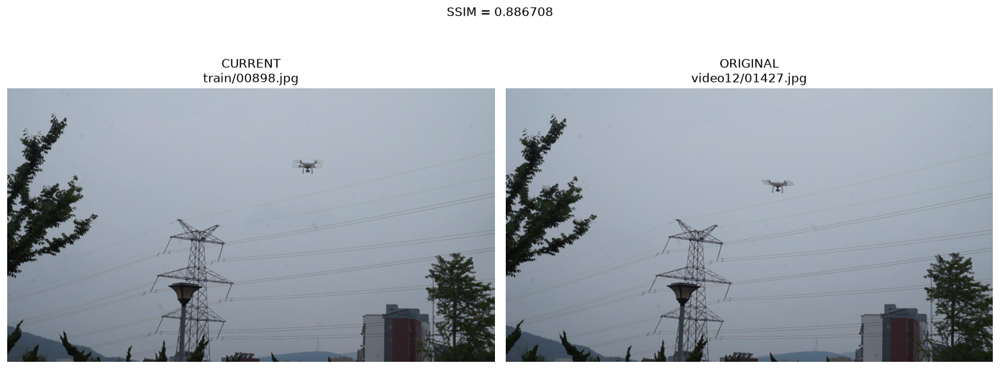

train/03945.jpg  <->  video19/01286.jpg   SSIM=0.929885


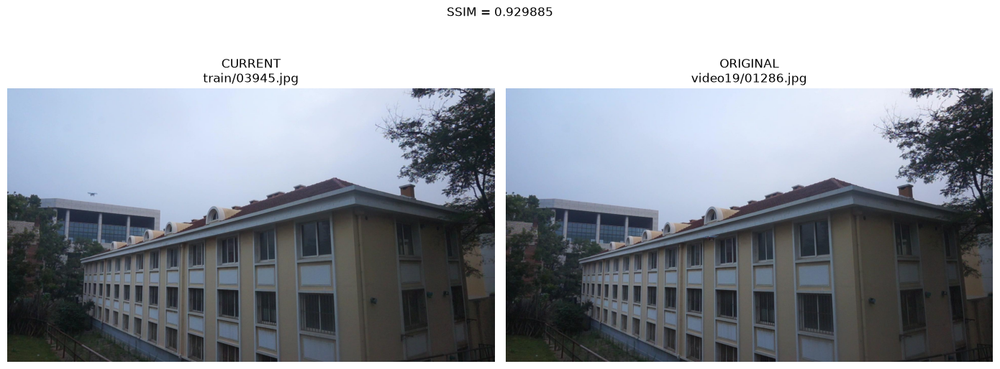

val/00449.jpg  <->  video12/01449.jpg   SSIM=0.936079


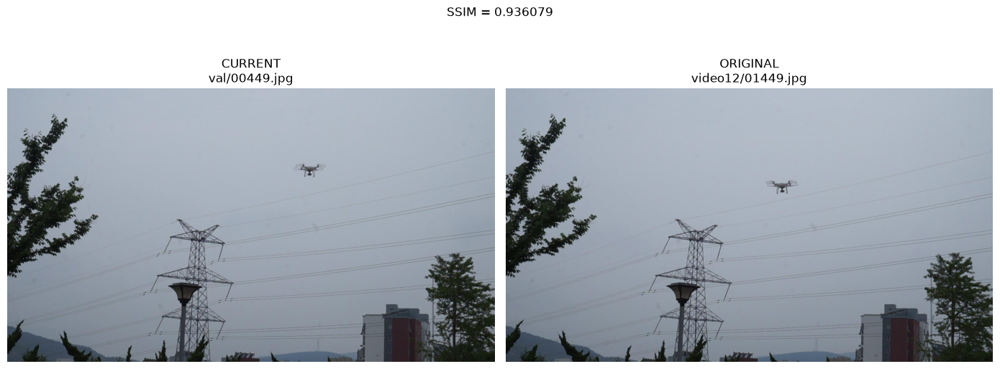

val/01972.jpg  <->  video19/01286.jpg   SSIM=0.930135


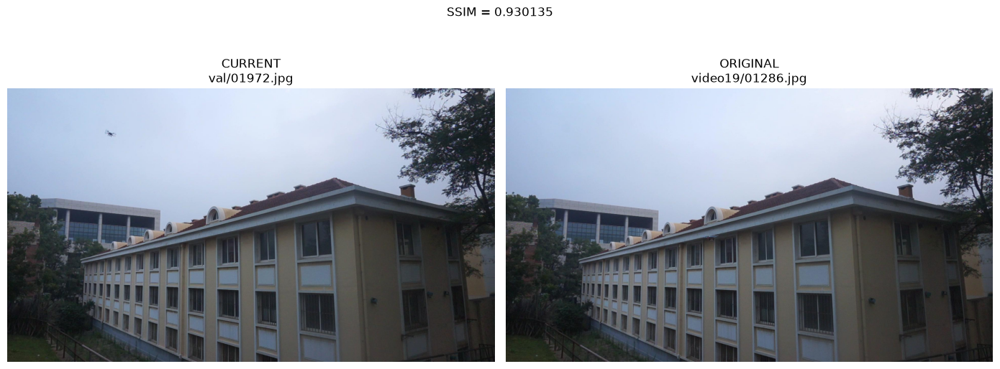

test/00683.jpg  <->  video15/00779.jpg   SSIM=0.886584


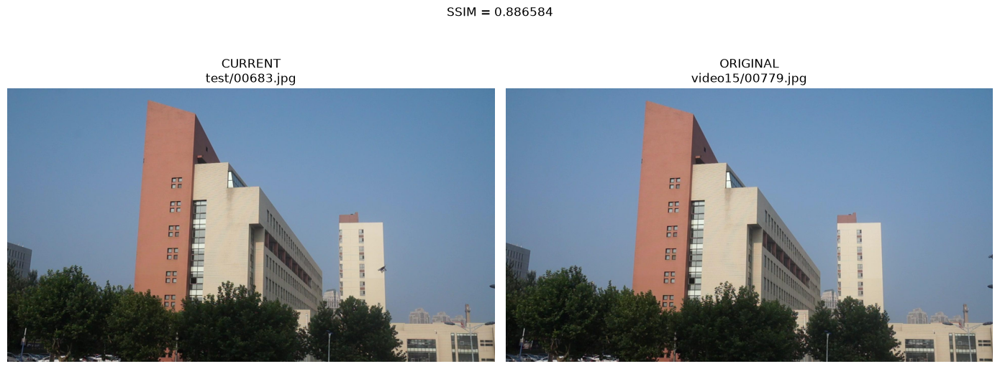

In [17]:
from pathlib import Path
import cv2
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim

CURRENT = Path(
    r"D:\master\Master_Drone_Detection"
    r"\02_datasets\DUT_Anti_UAV\images"
)

ORIGINAL = Path(
    r"D:\master\DUT Anti-UAV tracking"
    r"\Anti-UAV-Tracking-V0"
    r"\Anti-UAV-Tracking-V0"
)

pairs = [
    ("train", "00898.jpg", "video12", "01427.jpg"),
    ("train", "03945.jpg", "video19", "01286.jpg"),
    ("val",   "00449.jpg", "video12", "01449.jpg"),
    ("val",   "01972.jpg", "video19", "01286.jpg"),
    ("test",  "00683.jpg", "video15", "00779.jpg"),
]


def load_rgb(path):
    img = cv2.imread(str(path))

    if img is None:
        raise FileNotFoundError(path)

    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


def calculate_ssim(img1, img2):

    g1 = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
    g2 = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)

    # Compare at common resolution
    g1 = cv2.resize(g1, (640, 360))
    g2 = cv2.resize(g2, (640, 360))

    return ssim(g1, g2)


for split, current_file, video, frame in pairs:

    current_path = (
        CURRENT / split / current_file
    )

    original_path = (
        ORIGINAL / video / frame
    )

    current_img = load_rgb(current_path)
    original_img = load_rgb(original_path)

    score = calculate_ssim(
        current_img,
        original_img
    )

    print(
        f"{split}/{current_file}"
        f"  <->  "
        f"{video}/{frame}"
        f"   SSIM={score:.6f}"
    )

    fig, axes = plt.subplots(
        1, 2,
        figsize=(14, 6)
    )

    axes[0].imshow(current_img)
    axes[0].set_title(
        f"CURRENT\n{split}/{current_file}"
    )
    axes[0].axis("off")

    axes[1].imshow(original_img)
    axes[1].set_title(
        f"ORIGINAL\n{video}/{frame}"
    )
    axes[1].axis("off")

    plt.suptitle(
        f"SSIM = {score:.6f}"
    )

    plt.tight_layout()
    plt.show()

In [18]:
from pathlib import Path
import cv2
import pandas as pd

CURRENT = Path(
    r"D:\master\Master_Drone_Detection"
    r"\02_datasets\DUT_Anti_UAV\images"
)

ORIGINAL = Path(
    r"D:\master\DUT Anti-UAV tracking"
    r"\Anti-UAV-Tracking-V0"
    r"\Anti-UAV-Tracking-V0"
)

rows = []

# Current dataset
for split in ["train", "val", "test"]:
    paths = sorted((CURRENT / split).glob("*.jpg"))

    # sample up to 100 distributed images
    step = max(1, len(paths) // 100)

    for p in paths[::step][:100]:
        img = cv2.imread(str(p))

        if img is not None:
            h, w = img.shape[:2]

            rows.append({
                "source": f"current_{split}",
                "width": w,
                "height": h
            })


# Original dataset
for video_dir in sorted(ORIGINAL.glob("video*")):
    paths = sorted(video_dir.glob("*.jpg"))

    if not paths:
        continue

    # beginning, middle, end
    indices = [
        0,
        len(paths) // 2,
        len(paths) - 1
    ]

    for idx in indices:
        img = cv2.imread(str(paths[idx]))

        if img is not None:
            h, w = img.shape[:2]

            rows.append({
                "source": video_dir.name,
                "width": w,
                "height": h
            })


df = pd.DataFrame(rows)

print("=" * 70)
print("IMAGE DIMENSIONS")
print("=" * 70)

summary = (
    df.groupby(["source", "width", "height"])
      .size()
      .reset_index(name="count")
)

print(summary.to_string(index=False))

IMAGE DIMENSIONS
       source  width  height  count
 current_test    640     360      1
 current_test    960     720      1
 current_test   1280     720     37
 current_test   1920    1080     61
current_train    512     341      1
current_train    550     412      1
current_train    852     480      1
current_train    950     634      1
current_train   1280     720     12
current_train   1920    1080     84
  current_val    527     300      1
  current_val    620     350      1
  current_val    960     540      1
  current_val    960     640      1
  current_val   1280     720     12
  current_val   1920    1080     84
      video01   1920    1080      3
      video02   1280     720      3
      video03   1280     720      3
      video04   1920    1080      3
      video05   1280     720      3
      video06   1920    1080      3
      video07   1280     720      3
      video08   1280     720      3
      video09   1920    1080      3
      video10   1920    1080      3
      video

In [19]:
from pathlib import Path
import cv2
import numpy as np
import pandas as pd
from skimage.metrics import structural_similarity as ssim
from tqdm.auto import tqdm

CURRENT = Path(
    r"D:\master\Master_Drone_Detection"
    r"\02_datasets\DUT_Anti_UAV\images"
)

ORIGINAL = Path(
    r"D:\master\DUT Anti-UAV tracking"
    r"\Anti-UAV-Tracking-V0"
    r"\Anti-UAV-Tracking-V0"
)

OUT = Path(
    r"D:\master\Master_Drone_Detection"
    r"\04_experiments\dataset_integrity"
)

OUT.mkdir(parents=True, exist_ok=True)


# ------------------------------------------------------------
# Strong anchors already discovered
# ------------------------------------------------------------

anchors = [
    ("train", 898,  "video12", 1427),
    ("train", 3945, "video19", 1286),
    ("val",   449,  "video12", 1449),
    ("val",   1972, "video19", 1286),
    ("test",  683,  "video15", 779),
]


# ------------------------------------------------------------
# SSIM
# ------------------------------------------------------------

def load_gray(path):

    img = cv2.imread(
        str(path),
        cv2.IMREAD_GRAYSCALE
    )

    if img is None:
        return None

    # Same comparison resolution
    img = cv2.resize(
        img,
        (640, 360),
        interpolation=cv2.INTER_AREA
    )

    return img


def compare_ssim(img1, img2):

    if img1 is None or img2 is None:
        return np.nan

    return ssim(img1, img2)


# ------------------------------------------------------------
# Search locally around each anchor
# ------------------------------------------------------------

records = []

CURRENT_RADIUS = 10
ORIGINAL_RADIUS = 30


for split, current_center, video, original_center in anchors:

    print("\n" + "=" * 80)

    print(
        f"{split}/{current_center:05d} "
        f"<-> {video}/{original_center:05d}"
    )

    print("=" * 80)

    original_dir = ORIGINAL / video

    for current_idx in tqdm(
        range(
            max(1, current_center - CURRENT_RADIUS),
            current_center + CURRENT_RADIUS + 1
        ),
        desc=f"{split}-{video}"
    ):

        current_file = (
            CURRENT /
            split /
            f"{current_idx:05d}.jpg"
        )

        if not current_file.exists():
            continue

        current_img = load_gray(current_file)

        candidates = []

        for original_idx in range(
            max(1, original_center - ORIGINAL_RADIUS),
            original_center + ORIGINAL_RADIUS + 1
        ):

            original_file = (
                original_dir /
                f"{original_idx:05d}.jpg"
            )

            if not original_file.exists():
                continue

            original_img = load_gray(
                original_file
            )

            score = compare_ssim(
                current_img,
                original_img
            )

            candidates.append(
                (
                    score,
                    original_idx
                )
            )

        if not candidates:
            continue

        candidates.sort(
            reverse=True,
            key=lambda x: x[0]
        )

        best_score, best_original = (
            candidates[0]
        )

        records.append({
            "split": split,
            "current_frame": current_idx,
            "video": video,
            "best_original_frame":
                best_original,
            "ssim": best_score,
            "offset":
                best_original - current_idx
        })


# ------------------------------------------------------------
# RESULTS
# ------------------------------------------------------------

df = pd.DataFrame(records)

print("\n")
print("=" * 80)
print("TEMPORAL MAPPING RESULTS")
print("=" * 80)

for (split, video), group in df.groupby(
    ["split", "video"]
):

    print(
        f"\n--- {split} -> {video} ---"
    )

    print(
        group[
            [
                "current_frame",
                "best_original_frame",
                "ssim"
            ]
        ].to_string(
            index=False,
            formatters={
                "ssim":
                    lambda x: f"{x:.4f}"
            }
        )
    )


# ------------------------------------------------------------
# SUMMARY
# ------------------------------------------------------------

print("\n")
print("=" * 80)
print("SUMMARY")
print("=" * 80)

summary = (
    df.groupby(
        ["split", "video"]
    )
    .agg(
        images=("current_frame", "count"),
        mean_ssim=("ssim", "mean"),
        median_ssim=("ssim", "median"),
        min_ssim=("ssim", "min"),
        max_ssim=("ssim", "max")
    )
    .reset_index()
)

print(
    summary.to_string(
        index=False,
        formatters={
            "mean_ssim":
                lambda x: f"{x:.4f}",
            "median_ssim":
                lambda x: f"{x:.4f}",
            "min_ssim":
                lambda x: f"{x:.4f}",
            "max_ssim":
                lambda x: f"{x:.4f}",
        }
    )
)


# ------------------------------------------------------------
# SAVE
# ------------------------------------------------------------

save_path = (
    OUT /
    "temporal_source_mapping_validation.csv"
)

df.to_csv(
    save_path,
    index=False
)

print(
    "\nSaved to:",
    save_path
)


train/00898 <-> video12/01427


train-video12:   0%|          | 0/21 [00:00<?, ?it/s]


train/03945 <-> video19/01286


train-video19:   0%|          | 0/21 [00:00<?, ?it/s]


val/00449 <-> video12/01449


val-video12:   0%|          | 0/21 [00:00<?, ?it/s]


val/01972 <-> video19/01286


val-video19:   0%|          | 0/21 [00:00<?, ?it/s]


test/00683 <-> video15/00779


test-video15:   0%|          | 0/21 [00:00<?, ?it/s]



TEMPORAL MAPPING RESULTS

--- test -> video15 ---
 current_frame  best_original_frame   ssim
           673                  775 0.6845
           674                  775 0.6937
           675                  775 0.6944
           676                  775 0.6952
           677                  773 0.6943
           678                  775 0.6958
           679                  775 0.6952
           680                  758 0.8809
           681                  758 0.8785
           682                  770 0.8697
           683                  770 0.9304
           684                  809 0.9364
           685                  770 0.9157
           686                  776 0.5993
           687                  776 0.6002
           688                  776 0.5998
           689                  803 0.6111
           690                  803 0.6118
           691                  803 0.6118
           692                  803 0.6116
           693                  796 0.6177

-

In [20]:
from pathlib import Path
import cv2
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

CURRENT = Path(
    r"D:\master\Master_Drone_Detection"
    r"\02_datasets\DUT_Anti_UAV\images"
)

ORIGINAL = Path(
    r"D:\master\DUT Anti-UAV tracking"
    r"\Anti-UAV-Tracking-V0"
    r"\Anti-UAV-Tracking-V0"
)

OUT = Path(
    r"D:\master\Master_Drone_Detection"
    r"\04_experiments\dataset_integrity"
)
OUT.mkdir(parents=True, exist_ok=True)


# ------------------------------------------------------------
# pHash
# ------------------------------------------------------------

def phash(path, hash_size=16):

    img = cv2.imread(str(path), cv2.IMREAD_GRAYSCALE)

    if img is None:
        return None

    img = cv2.resize(
        img,
        (32, 32),
        interpolation=cv2.INTER_AREA
    )

    img = np.float32(img)

    dct = cv2.dct(img)
    low = dct[:hash_size, :hash_size]

    median = np.median(low[1:, 1:])

    return (low > median).flatten()


# ------------------------------------------------------------
# Representative frames from every original video
# ------------------------------------------------------------

FRAMES_PER_VIDEO = 150

video_db = {}

for video_dir in sorted(ORIGINAL.glob("video*")):

    frames = sorted(video_dir.glob("*.jpg"))

    if not frames:
        continue

    n = min(FRAMES_PER_VIDEO, len(frames))

    indices = np.linspace(
        0,
        len(frames) - 1,
        n,
        dtype=int
    )

    hashes = []
    paths = []

    print(f"Building {video_dir.name}...")

    for idx in tqdm(indices, leave=False):

        p = frames[idx]
        h = phash(p)

        if h is not None:
            hashes.append(h)
            paths.append(p)

    video_db[video_dir.name] = {
        "hashes": np.array(hashes, dtype=bool),
        "paths": paths
    }


# ------------------------------------------------------------
# Sample 300 current images from each split
# ------------------------------------------------------------

current_samples = []

for split in ["train", "val", "test"]:

    paths = sorted(
        (CURRENT / split).glob("*.jpg")
    )

    n = min(300, len(paths))

    indices = np.linspace(
        0,
        len(paths) - 1,
        n,
        dtype=int
    )

    for idx in indices:
        current_samples.append(
            (split, paths[idx])
        )


print("\nCurrent images to classify:",
      len(current_samples))


# ------------------------------------------------------------
# Sequence classification
# ------------------------------------------------------------

records = []

for split, current_path in tqdm(
    current_samples,
    desc="Classifying sequence"
):

    q = phash(current_path)

    if q is None:
        continue

    video_scores = []

    for video, info in video_db.items():

        hashes = info["hashes"]

        distances = np.count_nonzero(
            hashes != q,
            axis=1
        )

        best_idx = np.argmin(distances)

        video_scores.append({
            "video": video,
            "distance": int(
                distances[best_idx]
            ),
            "frame":
                info["paths"][best_idx].name
        })

    video_scores.sort(
        key=lambda x: x["distance"]
    )

    best = video_scores[0]
    second = video_scores[1]

    records.append({
        "split": split,
        "current_file":
            current_path.name,

        "best_video":
            best["video"],

        "best_frame":
            best["frame"],

        "best_distance":
            best["distance"],

        "second_video":
            second["video"],

        "second_distance":
            second["distance"],

        # Larger gap = more confidence
        "margin":
            second["distance"]
            - best["distance"]
    })


df = pd.DataFrame(records)


# ------------------------------------------------------------
# Results
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("BEST DISTANCE DISTRIBUTION")
print("=" * 80)

print(
    df["best_distance"].describe()
)


print("\n" + "=" * 80)
print("MARGIN DISTRIBUTION")
print("=" * 80)

print(
    df["margin"].describe()
)


print("\n" + "=" * 80)
print("VERY STRONG MATCHES: distance <= 10")
print("=" * 80)

strong = df[
    df["best_distance"] <= 10
]

print("Count:", len(strong))

print(
    pd.crosstab(
        strong["best_video"],
        strong["split"]
    ).to_string()
)


print("\n" + "=" * 80)
print("STRONG MATCHES: distance <= 20")
print("=" * 80)

strong20 = df[
    df["best_distance"] <= 20
]

print("Count:", len(strong20))

print(
    pd.crosstab(
        strong20["best_video"],
        strong20["split"]
    ).to_string()
)


print("\n" + "=" * 80)
print("TOP 30 STRONGEST")
print("=" * 80)

print(
    df.sort_values(
        "best_distance"
    )
    .head(30)
    .to_string(index=False)
)


save_path = (
    OUT /
    "sequence_classification_sample.csv"
)

df.to_csv(
    save_path,
    index=False
)

print("\nSaved:", save_path)

Building video01...


  0%|          | 0/150 [00:00<?, ?it/s]

Building video02...


  0%|          | 0/83 [00:00<?, ?it/s]

Building video03...


  0%|          | 0/100 [00:00<?, ?it/s]

Building video04...


  0%|          | 0/150 [00:00<?, ?it/s]

Building video05...


  0%|          | 0/150 [00:00<?, ?it/s]

Building video06...


  0%|          | 0/150 [00:00<?, ?it/s]

Building video07...


  0%|          | 0/150 [00:00<?, ?it/s]

Building video08...


  0%|          | 0/150 [00:00<?, ?it/s]

Building video09...


  0%|          | 0/150 [00:00<?, ?it/s]

Building video10...


  0%|          | 0/150 [00:00<?, ?it/s]

Building video11...


  0%|          | 0/150 [00:00<?, ?it/s]

Building video12...


  0%|          | 0/150 [00:00<?, ?it/s]

Building video13...


  0%|          | 0/150 [00:00<?, ?it/s]

Building video14...


  0%|          | 0/150 [00:00<?, ?it/s]

Building video15...


  0%|          | 0/150 [00:00<?, ?it/s]

Building video16...


  0%|          | 0/150 [00:00<?, ?it/s]

Building video17...


  0%|          | 0/150 [00:00<?, ?it/s]

Building video18...


  0%|          | 0/150 [00:00<?, ?it/s]

Building video19...


  0%|          | 0/150 [00:00<?, ?it/s]

Building video20...


  0%|          | 0/150 [00:00<?, ?it/s]


Current images to classify: 900


Classifying sequence:   0%|          | 0/900 [00:00<?, ?it/s]


BEST DISTANCE DISTRIBUTION
count    900.000000
mean      93.567778
std       20.952323
min        0.000000
25%       95.000000
50%       99.000000
75%      102.000000
max      108.000000
Name: best_distance, dtype: float64

MARGIN DISTRIBUTION
count    900.000000
mean       8.362222
std       19.907794
min        0.000000
25%        1.000000
50%        3.000000
75%        6.000000
max      103.000000
Name: margin, dtype: float64

VERY STRONG MATCHES: distance <= 10
Count: 36
split       test  train  val
best_video                  
video11        1      1    0
video12        1      2    1
video13        1      1    1
video15        3      3    3
video16        0      2    2
video17        1      1    1
video18        0      1    1
video19        3      3    3

STRONG MATCHES: distance <= 20
Count: 44
split       test  train  val
best_video                  
video07        1      0    0
video11        1      1    0
video12        2      2    2
video13        1      2    2
video15      

train/03374.jpg -> video17/00142.jpg | SSIM=0.804080


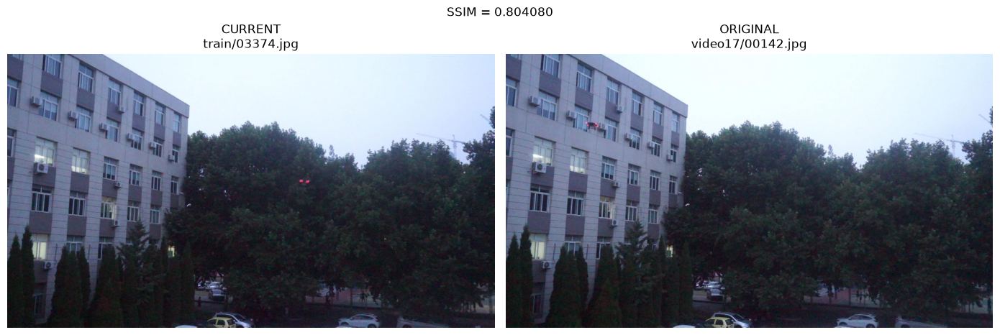

val/01687.jpg -> video17/00142.jpg | SSIM=0.799475


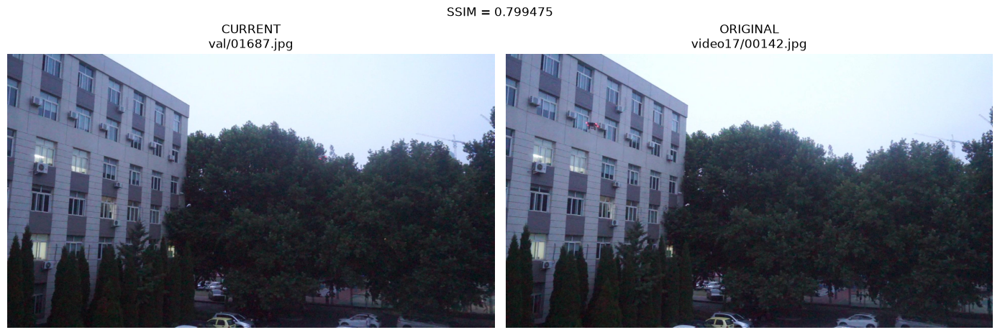

train/03148.jpg -> video16/00035.jpg | SSIM=0.962635


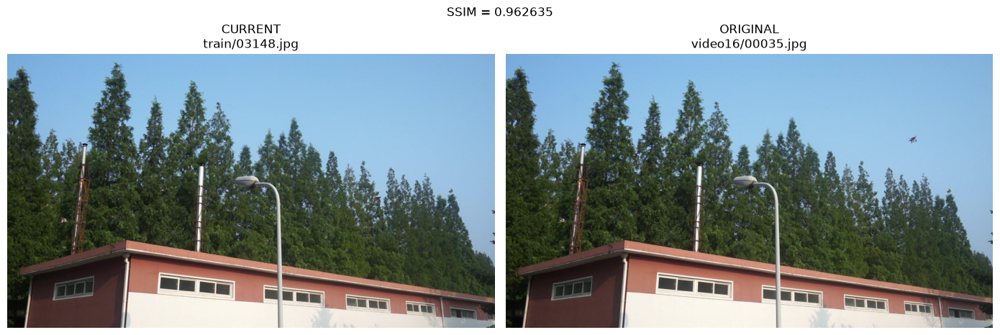

val/01574.jpg -> video16/00035.jpg | SSIM=0.962692


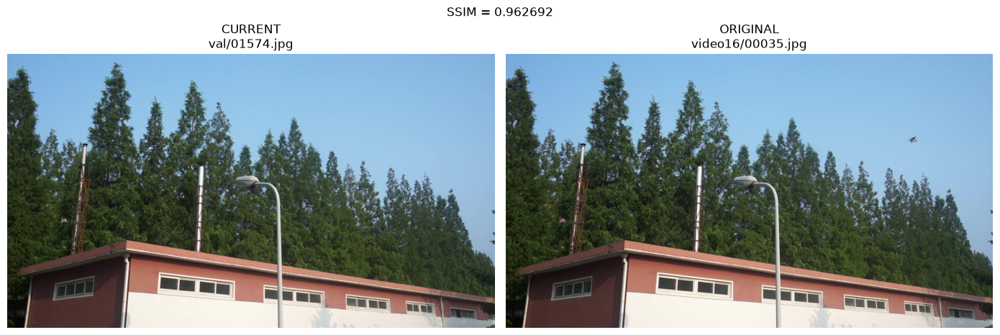

train/03965.jpg -> video19/01160.jpg | SSIM=0.938181


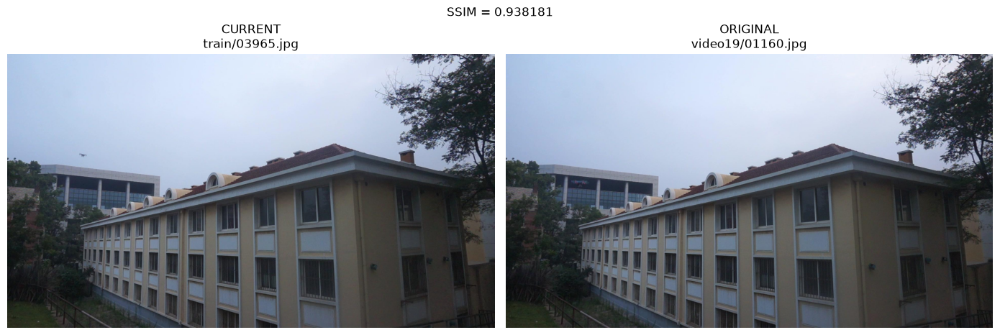

val/01965.jpg -> video19/01160.jpg | SSIM=0.813003


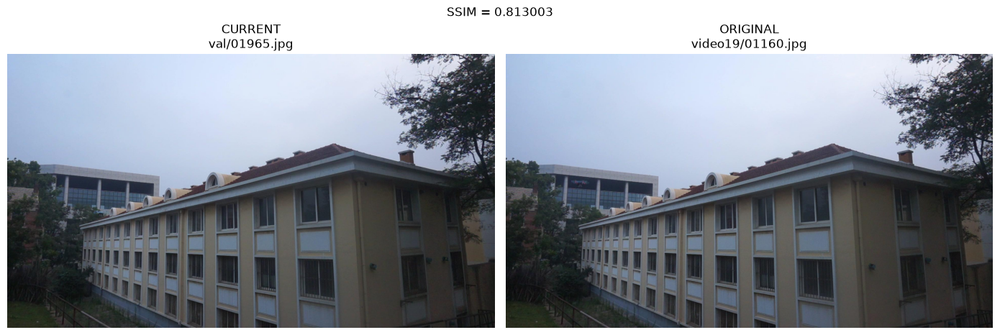

test/02030.jpg -> video19/01160.jpg | SSIM=0.908362


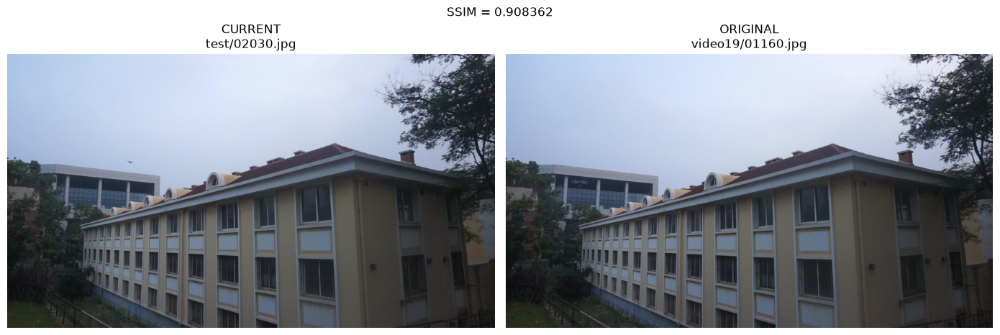

test/00809.jpg -> video19/01160.jpg | SSIM=0.889953


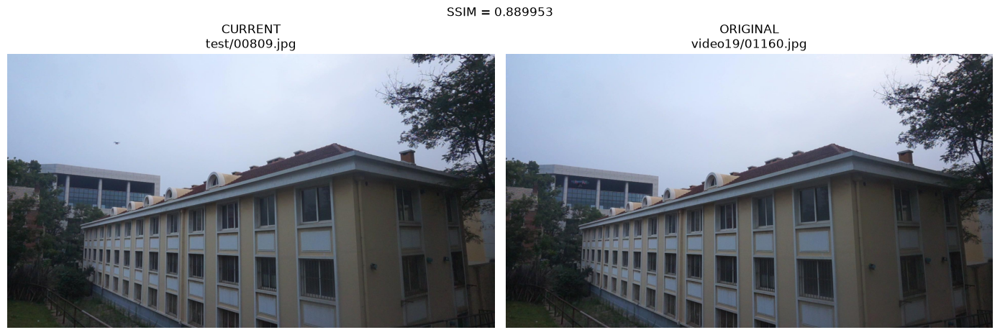


SUMMARY
train 03374.jpg -> video17/00142.jpg SSIM=0.804080
val   01687.jpg -> video17/00142.jpg SSIM=0.799475
train 03148.jpg -> video16/00035.jpg SSIM=0.962635
val   01574.jpg -> video16/00035.jpg SSIM=0.962692
train 03965.jpg -> video19/01160.jpg SSIM=0.938181
val   01965.jpg -> video19/01160.jpg SSIM=0.813003
test  02030.jpg -> video19/01160.jpg SSIM=0.908362
test  00809.jpg -> video19/01160.jpg SSIM=0.889953


In [21]:
from pathlib import Path
import cv2
from skimage.metrics import structural_similarity as ssim
import matplotlib.pyplot as plt

CURRENT = Path(
    r"D:\master\Master_Drone_Detection"
    r"\02_datasets\DUT_Anti_UAV\images"
)

ORIGINAL = Path(
    r"D:\master\DUT Anti-UAV tracking"
    r"\Anti-UAV-Tracking-V0"
    r"\Anti-UAV-Tracking-V0"
)

# Most important cross-split cases
cases = [
    # same original video17/frame00142
    ("train", "03374.jpg", "video17", "00142.jpg"),
    ("val",   "01687.jpg", "video17", "00142.jpg"),

    # same original video16/frame00035
    ("train", "03148.jpg", "video16", "00035.jpg"),
    ("val",   "01574.jpg", "video16", "00035.jpg"),

    # video19/frame01160 across train/val/test
    ("train", "03965.jpg", "video19", "01160.jpg"),
    ("val",   "01965.jpg", "video19", "01160.jpg"),
    ("test",  "02030.jpg", "video19", "01160.jpg"),
    ("test",  "00809.jpg", "video19", "01160.jpg"),
]


def load_rgb(path):
    img = cv2.imread(str(path))

    if img is None:
        raise FileNotFoundError(path)

    return cv2.cvtColor(
        img,
        cv2.COLOR_BGR2RGB
    )


def calc_ssim(a, b):

    a = cv2.cvtColor(
        a,
        cv2.COLOR_RGB2GRAY
    )

    b = cv2.cvtColor(
        b,
        cv2.COLOR_RGB2GRAY
    )

    a = cv2.resize(a, (640, 360))
    b = cv2.resize(b, (640, 360))

    return ssim(a, b)


results = []

for split, current_file, video, frame in cases:

    current_path = (
        CURRENT / split / current_file
    )

    original_path = (
        ORIGINAL / video / frame
    )

    current_img = load_rgb(current_path)
    original_img = load_rgb(original_path)

    score = calc_ssim(
        current_img,
        original_img
    )

    results.append(
        (
            split,
            current_file,
            video,
            frame,
            score
        )
    )

    print(
        f"{split}/{current_file}"
        f" -> {video}/{frame}"
        f" | SSIM={score:.6f}"
    )

    fig, axes = plt.subplots(
        1, 2,
        figsize=(14, 5)
    )

    axes[0].imshow(current_img)
    axes[0].set_title(
        f"CURRENT\n{split}/{current_file}"
    )
    axes[0].axis("off")

    axes[1].imshow(original_img)
    axes[1].set_title(
        f"ORIGINAL\n{video}/{frame}"
    )
    axes[1].axis("off")

    plt.suptitle(
        f"SSIM = {score:.6f}"
    )

    plt.tight_layout()
    plt.show()


print("\n" + "=" * 75)
print("SUMMARY")
print("=" * 75)

for split, current_file, video, frame, score in results:

    print(
        f"{split:5s} "
        f"{current_file} -> "
        f"{video}/{frame} "
        f"SSIM={score:.6f}"
    )